# Data Science Fundamentals in Practice

## Table of Contents

- Data Wrangling and EDA
- Data Visualization
- Regression Analysis
- Classification Analysis
- Models Optimization

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
# !pip install xgboost
import xgboost as xgb
from sklearn.metrics import accuracy_score, mean_squared_error, mean_absolute_error, r2_score
from math import sqrt
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.svm import LinearSVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
# ! pip install scikit-optimize
from skopt import BayesSearchCV

In [2]:
hr_df = pd.read_csv('../data/hr.csv')
investments_df = pd.read_csv('../data/crypto-daily-prices.csv')
daily_return_df = pd.read_csv('../data/crypto-daily-returns.csv')
cancer_df = pd.read_csv('../data/cancer.csv')
uni_adm_df = pd.read_csv('../data/university-admission.csv')
life_expectancy_df = pd.read_csv('../data/life-expectancy-data.csv')
telecom_df = pd.read_csv('../data/telecom-churn.csv')
credit_card_df = pd.read_csv('../data/uci_credit_card.csv')
bike_df = pd.read_csv('../data/bike-sharing-daily.csv')

## Data Wrangling and EDA

### Loading Data and Conducting Fundamental Statistics

In [3]:
type(hr_df)

pandas.core.frame.DataFrame

In [4]:
hr_df.head(3)

,Age,MonthlyIncome,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,5993.0,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,...,1,80,0,8,0,1,6,4,0,5
1,49,NaN,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,...,4,80,1,10,3,3,10,7,1,7
2,37,2090.0,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,...,2,80,0,7,3,3,0,0,0,0


In [5]:
hr_df.tail(7)

,Age,MonthlyIncome,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1463,31,9936.0,No,Non-Travel,325,Research & Development,5,3,Medical,1,...,2,80,0,10,2,3,9,4,1,7
1464,26,2966.0,No,Travel_Rarely,1167,Sales,5,3,Other,1,...,4,80,0,5,2,3,4,2,0,0
1465,36,2571.0,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,...,3,80,1,17,3,3,5,2,0,3
1466,39,9991.0,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,...,1,80,1,9,5,3,7,7,1,7
1467,27,6142.0,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,...,2,80,1,6,0,3,6,2,0,3
1468,49,5390.0,No,Travel_Frequently,1023,Sales,2,3,Medical,1,...,4,80,0,17,3,2,9,6,0,8
1469,34,4404.0,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,...,1,80,0,6,3,4,4,3,1,2


In [6]:
hr_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1470 non-null   int64  
 1   MonthlyIncome             1467 non-null   float64
 2   Attrition                 1470 non-null   object 
 3   BusinessTravel            1470 non-null   object 
 4   DailyRate                 1470 non-null   int64  
 5   Department                1469 non-null   object 
 6   DistanceFromHome          1470 non-null   int64  
 7   Education                 1470 non-null   int64  
 8   EducationField            1469 non-null   object 
 9   EmployeeCount             1470 non-null   int64  
 10  EmployeeNumber            1469 non-null   float64
 11  EnvironmentSatisfaction   1470 non-null   int64  
 12  Gender                    1469 non-null   object 
 13  HourlyRate                1470 non-null   int64  
 14  JobInvol

In [7]:
hr_df.describe()

,Age,MonthlyIncome,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1467.000000,1470.000000,1470.000000,1470.000000,1470.0,1469.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,6505.155419,802.485714,9.192517,2.912925,1.0,1025.556161,2.721769,65.891156,2.729932,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,4711.297846,403.509100,8.106864,1.024165,0.0,601.646166,1.093082,20.329428,0.711561,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,1009.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,2911.000000,465.000000,2.000000,2.000000,1.0,492.000000,2.000000,48.000000,2.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,4908.000000,802.000000,7.000000,3.000000,1.0,1022.000000,3.000000,66.000000,3.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,8378.000000,1157.000000,14.000000,4.000000,1.0,1556.000000,4.000000,83.750000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,19999.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


### Addressing Missing Data

In [8]:
hr_df.isnull() # to locate rows with missing values

,Age,MonthlyIncome,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1466,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1467,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1468,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [9]:
hr_df.isnull().sum() # False = 0, True = 1

Age                         0
MonthlyIncome               3
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  1
DistanceFromHome            0
Education                   0
EducationField              1
EmployeeCount               0
EmployeeNumber              1
EnvironmentSatisfaction     0
Gender                      1
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     1
JobSatisfaction             0
MaritalStatus               1
MonthlyRate                 2
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           1
PerformanceRating           1
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [10]:
hr_df.dropna(how = 'any', inplace = True) # to drop any row that contains a missing value
hr_df.isnull().sum()

Age                         0
MonthlyIncome               0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [11]:
# hr_df = pd.read_csv('hr.csv')
# hr_df['MonthlyIncome'].isnull().sum() # 3

In [12]:
# hr_df['MonthlyIncome'].fillna(hr_df['MonthlyIncome'].mean(), inplace = True)
# hr_df['MonthlyIncome'].isnull().sum() # 0

### Implementing One Hot Encoding

In [13]:
hr_df['BusinessTravel'].unique()

array(['Travel_Rarely', 'Travel_Frequently', 'Non-Travel'], dtype=object)

In [14]:
business_travel_encoded = pd.get_dummies(hr_df['BusinessTravel'])
print(business_travel_encoded)

      Non-Travel  Travel_Frequently  Travel_Rarely
0          False              False           True
2          False              False           True
3          False               True          False
4          False              False           True
5          False               True          False
...          ...                ...            ...
1465       False               True          False
1466       False              False           True
1467       False              False           True
1468       False               True          False
1469       False              False           True

[1463 rows x 3 columns]


In [15]:
hr_df['EducationField'].unique()

array(['Life Sciences', 'Other', 'Medical', 'Marketing',
       'Technical Degree', 'Human Resources'], dtype=object)

In [16]:
education_field_encoded = pd.get_dummies(hr_df['EducationField'])
print(education_field_encoded)

      Human Resources  Life Sciences  Marketing  Medical  Other  \
0               False           True      False    False  False   
2               False          False      False    False   True   
3               False           True      False    False  False   
4               False          False      False     True  False   
5               False           True      False    False  False   
...               ...            ...        ...      ...    ...   
1465            False          False      False     True  False   
1466            False          False      False     True  False   
1467            False           True      False    False  False   
1468            False          False      False     True  False   
1469            False          False      False     True  False   

      Technical Degree  
0                False  
2                False  
3                False  
4                False  
5                False  
...                ...  
1465             Fal

### Executing Feature Scaling (Normalization and Standardization)

In [17]:
hr_df['Age'].values

array([41, 37, 33, ..., 27, 49, 34])

In [18]:
hr_df['Age'].values.reshape(-1,1)

array([[41],
       [37],
       [33],
       ...,
       [27],
       [49],
       [34]])

In [19]:
# Normalization scales feature values to a range of 0 to 1.
# min_max_scaler = MinMaxScaler()
# hr_df['Age'] = min_max_scaler.fit_transform(hr_df['Age'].values.reshape(-1,1))
# hr_df['Age']

In [20]:
# Standardization transforms data to have a mean of zero and a standard deviation of 1.
# Standardization, or Z-score normalization,
# aligns properties with the characteristics of a standard normal distribution.
standard_scaler = StandardScaler()
hr_df['Age'] = standard_scaler.fit_transform(hr_df['Age'].values.reshape(-1,1))
# A normalized dataset ranges from 0 to 1,
# while a standardized dataset has a mean of 0 and a standard deviation of 1,
# allowing for variable upper and lower values.
hr_df.describe().round(2)

,Age,MonthlyIncome,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1463.00,1463.00,1463.00,1463.00,1463.00,1463.0,1463.00,1463.00,1463.00,1463.00,...,1463.00,1463.0,1463.00,1463.00,1463.00,1463.00,1463.00,1463.00,1463.00,1463.00
mean,0.00,6514.97,802.11,9.18,2.92,1.0,1028.72,2.72,65.86,2.73,...,2.71,80.0,0.79,11.30,2.80,2.76,7.02,4.23,2.19,4.13
std,1.00,4713.52,403.46,8.11,1.02,0.0,600.06,1.09,20.33,0.71,...,1.08,0.0,0.85,7.78,1.29,0.71,6.13,3.62,3.23,3.57
min,-2.08,1009.00,102.00,1.00,1.00,1.0,1.00,1.00,30.00,1.00,...,1.00,80.0,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
25%,-0.76,2918.50,465.00,2.00,2.00,1.0,495.50,2.00,48.00,2.00,...,2.00,80.0,0.00,6.00,2.00,2.00,3.00,2.00,0.00,2.00
50%,-0.10,4936.00,802.00,7.00,3.00,1.0,1025.00,3.00,66.00,3.00,...,3.00,80.0,1.00,10.00,3.00,3.00,5.00,3.00,1.00,3.00
75%,0.67,8380.50,1157.00,14.00,4.00,1.0,1557.50,4.00,83.50,3.00,...,4.00,80.0,1.00,15.00,3.00,3.00,9.00,7.00,3.00,7.00
max,2.54,19999.00,1499.00,29.00,5.00,1.0,2068.00,4.00,100.00,4.00,...,4.00,80.0,3.00,40.00,6.00,4.00,40.00,18.00,15.00,17.00


### Performing Filtering

In [21]:
loyal_employees_df = hr_df[hr_df['YearsAtCompany'] >= 30]
loyal_employees_df

,Age,MonthlyIncome,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
98,2.316217,13872.0,No,Travel_Rarely,682,Sales,10,4,Medical,1,...,3,80,0,38,1,2,37,10,1,8
126,2.316217,10312.0,Yes,Travel_Rarely,147,Research & Development,23,4,Medical,1,...,4,80,1,40,3,2,40,10,15,6
190,1.657016,19999.0,No,Travel_Rarely,699,Research & Development,1,4,Life Sciences,1,...,1,80,1,34,5,3,33,18,11,9
237,1.657016,19068.0,No,Non-Travel,771,Sales,2,4,Life Sciences,1,...,4,80,0,33,2,4,33,7,15,12
270,1.986616,19045.0,No,Travel_Rarely,452,Research & Development,1,3,Medical,1,...,3,80,0,37,2,3,36,10,4,13
473,1.327415,19502.0,No,Travel_Rarely,1245,Research & Development,18,4,Life Sciences,1,...,3,80,1,31,5,3,31,9,0,9
477,1.437282,18200.0,No,Travel_Frequently,1246,Human Resources,3,3,Medical,1,...,3,80,1,32,2,3,32,5,10,7
561,1.657016,16856.0,No,Travel_Rarely,621,Sales,3,4,Marketing,1,...,1,80,0,34,3,4,34,6,1,16
595,2.316217,19246.0,Yes,Travel_Rarely,286,Research & Development,2,4,Life Sciences,1,...,4,80,0,40,2,3,31,15,13,8
653,1.437282,17924.0,No,Non-Travel,881,Research & Development,2,4,Life Sciences,1,...,4,80,1,31,3,3,31,6,14,7


In [22]:
loyal_employees_rd_df = hr_df[(hr_df['YearsAtCompany'] >= 30) &
                              (hr_df['Department'] == 'Research & Development')]
loyal_employees_rd_df

,Age,MonthlyIncome,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
126,2.316217,10312.0,Yes,Travel_Rarely,147,Research & Development,23,4,Medical,1,...,4,80,1,40,3,2,40,10,15,6
190,1.657016,19999.0,No,Travel_Rarely,699,Research & Development,1,4,Life Sciences,1,...,1,80,1,34,5,3,33,18,11,9
270,1.986616,19045.0,No,Travel_Rarely,452,Research & Development,1,3,Medical,1,...,3,80,0,37,2,3,36,10,4,13
473,1.327415,19502.0,No,Travel_Rarely,1245,Research & Development,18,4,Life Sciences,1,...,3,80,1,31,5,3,31,9,0,9
595,2.316217,19246.0,Yes,Travel_Rarely,286,Research & Development,2,4,Life Sciences,1,...,4,80,0,40,2,3,31,15,13,8
653,1.437282,17924.0,No,Non-Travel,881,Research & Development,2,4,Life Sciences,1,...,4,80,1,31,3,3,31,6,14,7
914,1.986616,13577.0,No,Non-Travel,177,Research & Development,8,1,Medical,1,...,4,80,1,34,3,3,33,9,15,0
1086,1.437282,14411.0,No,Travel_Frequently,333,Research & Development,22,5,Medical,1,...,4,80,0,32,2,3,32,6,13,9
1111,1.766883,10169.0,Yes,Travel_Rarely,607,Research & Development,2,5,Technical Degree,1,...,2,80,1,34,4,3,33,7,1,9
1138,1.437282,11245.0,No,Travel_Frequently,1234,Research & Development,20,5,Medical,1,...,3,80,1,32,3,3,30,8,12,13


In [23]:
hr_df[hr_df['DailyRate'].between(800,805)]

,Age,MonthlyIncome,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
133,0.448479,8189.0,No,Travel_Rarely,802,Sales,9,1,Life Sciences,1,...,3,80,1,12,2,3,9,7,0,7
553,0.338612,2342.0,No,Travel_Rarely,804,Research & Development,2,1,Medical,1,...,4,80,0,5,2,2,4,2,2,3
589,-0.869924,2319.0,Yes,Travel_Rarely,805,Research & Development,1,2,Life Sciences,1,...,4,80,1,1,1,3,1,0,0,0
696,0.887947,4447.0,No,Non-Travel,805,Research & Development,4,2,Life Sciences,1,...,2,80,0,9,5,2,9,7,0,8
740,-0.210722,3917.0,No,Travel_Rarely,802,Research & Development,10,3,Other,1,...,1,80,1,3,4,2,3,2,1,2
742,1.437282,2380.0,No,Travel_Rarely,804,Research & Development,9,3,Life Sciences,1,...,2,80,0,8,5,3,1,0,0,0
856,-1.858726,3033.0,No,Travel_Rarely,805,Research & Development,3,3,Life Sciences,1,...,1,80,0,2,2,2,2,2,1,2
1431,-0.540323,10422.0,No,Travel_Rarely,801,Sales,1,4,Marketing,1,...,3,80,2,14,3,3,14,10,5,7


In [24]:
high_rate_df = hr_df[hr_df['DailyRate'] >= 1450]
high_rate_df['DailyRate'].sum()

73749

### Exploring Both Classes

In [25]:
hr_df.drop(['EmployeeCount', 'StandardHours', 'Over18', 'EmployeeNumber'], axis=1, inplace=True)
left_df = hr_df[hr_df['Attrition'] == 'Yes']
left_df

,Age,MonthlyIncome,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.448479,5993.0,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,...,3.0,1,0,8,0,1,6,4,0,5
2,0.009012,2090.0,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,...,3.0,2,0,7,3,3,0,0,0,0
14,-0.979791,2028.0,Yes,Travel_Rarely,103,Research & Development,24,3,Life Sciences,3,...,3.0,2,0,6,4,3,4,2,0,3
21,-0.100855,3407.0,Yes,Travel_Rarely,1218,Sales,9,4,Life Sciences,3,...,4.0,2,0,10,4,3,5,3,0,3
24,-0.320589,2960.0,Yes,Travel_Rarely,699,Research & Development,6,1,Medical,2,...,3.0,3,0,8,2,3,4,2,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1438,-1.529125,1790.0,Yes,Travel_Frequently,638,Sales,9,3,Marketing,4,...,3.0,1,1,1,3,2,1,0,1,0
1442,-0.869924,4787.0,Yes,Travel_Rarely,1092,Research & Development,1,4,Medical,1,...,3.0,2,3,4,3,4,2,2,2,2
1444,2.096483,2339.0,Yes,Travel_Rarely,310,Research & Development,7,2,Technical Degree,4,...,3.0,4,1,14,4,1,10,9,9,8
1452,1.437282,6728.0,Yes,Travel_Frequently,878,Sales,1,4,Life Sciences,2,...,3.0,4,2,12,3,3,6,3,0,1


In [26]:
left_df.describe()

,Age,MonthlyIncome,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,...,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000
mean,-0.372264,4771.588983,749.177966,10.656780,2.838983,2.466102,65.580508,2.516949,1.631356,2.470339,...,3.156780,2.597458,0.529661,8.237288,2.627119,2.661017,5.118644,2.885593,1.923729,2.834746
std,1.058592,3640.097444,402.338656,8.462483,1.010332,1.171885,20.142415,0.774410,0.938373,1.120016,...,0.364366,1.127525,0.857489,7.183525,1.256788,0.817056,5.959679,3.170282,3.142453,3.138339
min,-2.078460,1009.000000,103.000000,1.000000,1.000000,1.000000,31.000000,1.000000,1.000000,1.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,-1.007257,2371.500000,403.750000,3.000000,2.000000,1.000000,49.750000,2.000000,1.000000,1.000000,...,3.000000,2.000000,0.000000,3.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000
50%,-0.595256,3187.000000,696.000000,9.000000,3.000000,3.000000,66.000000,3.000000,1.000000,3.000000,...,3.000000,3.000000,0.000000,7.000000,2.000000,3.000000,3.000000,2.000000,1.000000,2.000000
75%,0.228746,5850.000000,1092.250000,17.000000,4.000000,4.000000,84.000000,3.000000,2.000000,3.000000,...,3.000000,4.000000,1.000000,10.000000,3.000000,3.000000,7.000000,4.000000,2.000000,5.000000
max,2.316217,19859.000000,1496.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,15.000000,15.000000,14.000000


In [27]:
stayed_df = hr_df[hr_df['Attrition'] == 'No']
stayed_df

,Age,MonthlyIncome,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
3,-0.430456,2909.0,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,...,3.0,3,0,8,3,3,8,7,3,0
4,-1.089658,3468.0,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,...,3.0,4,1,6,3,3,2,2,2,2
5,-0.540323,3068.0,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,4,...,3.0,3,0,8,2,2,7,7,3,6
8,0.118879,9526.0,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,4,...,4.0,2,0,10,2,3,9,7,1,8
9,-0.100855,5237.0,No,Travel_Rarely,1299,Research & Development,27,3,Medical,3,...,3.0,2,2,17,3,2,7,7,7,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-0.100855,2571.0,No,Travel_Frequently,884,Research & Development,23,2,Medical,3,...,3.0,3,1,17,3,3,5,2,0,3
1466,0.228746,9991.0,No,Travel_Rarely,613,Research & Development,6,1,Medical,4,...,3.0,1,1,9,5,3,7,7,1,7
1467,-1.089658,6142.0,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,...,4.0,2,1,6,0,3,6,2,0,3
1468,1.327415,5390.0,No,Travel_Frequently,1023,Sales,2,3,Medical,4,...,3.0,4,0,17,3,2,9,6,0,8


In [28]:
stayed_df.describe()

,Age,MonthlyIncome,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1227.000000,1227.000000,1227.000000,1227.000000,1227.000000,1227.000000,1227.000000,1227.000000,1227.000000,1227.000000,...,1227.000000,1227.000000,1227.000000,1227.000000,1227.000000,1227.000000,1227.000000,1227.000000,1227.000000,1227.000000
mean,0.071601,6850.284434,812.288509,8.900570,2.930725,2.770171,65.914425,2.768541,2.149959,2.778321,...,3.151589,2.734311,0.843521,11.888346,2.831296,2.781581,7.381418,4.489813,2.242869,4.374898
std,0.972987,4822.513734,403.042216,8.013949,1.025416,1.071349,20.376954,0.691516,1.118730,1.093397,...,0.358769,1.071424,0.840432,7.758787,1.293123,0.682730,6.093982,3.640517,3.239946,3.589856
min,-2.078460,1051.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,-0.650190,3225.000000,477.500000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,-0.100855,5208.000000,817.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,6.000000,3.000000,1.000000,3.000000
75%,0.668213,8842.000000,1175.000000,13.000000,4.000000,4.000000,83.000000,3.000000,3.000000,4.000000,...,3.000000,4.000000,1.000000,16.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000
max,2.535951,19999.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,...,4.000000,4.000000,3.000000,38.000000,6.000000,4.000000,37.000000,18.000000,15.000000,17.000000


### Applying Functions

In [29]:
def dailyrate_update(balance):
    return balance * 1.1

In [30]:
hr_df['DailyRate'] = hr_df['DailyRate'].apply(dailyrate_update)
hr_df

,Age,MonthlyIncome,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.448479,5993.0,Yes,Travel_Rarely,1212.2,Sales,1,2,Life Sciences,2,...,3.0,1,0,8,0,1,6,4,0,5
2,0.009012,2090.0,Yes,Travel_Rarely,1510.3,Research & Development,2,2,Other,4,...,3.0,2,0,7,3,3,0,0,0,0
3,-0.430456,2909.0,No,Travel_Frequently,1531.2,Research & Development,3,4,Life Sciences,4,...,3.0,3,0,8,3,3,8,7,3,0
4,-1.089658,3468.0,No,Travel_Rarely,650.1,Research & Development,2,1,Medical,1,...,3.0,4,1,6,3,3,2,2,2,2
5,-0.540323,3068.0,No,Travel_Frequently,1105.5,Research & Development,2,2,Life Sciences,4,...,3.0,3,0,8,2,2,7,7,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-0.100855,2571.0,No,Travel_Frequently,972.4,Research & Development,23,2,Medical,3,...,3.0,3,1,17,3,3,5,2,0,3
1466,0.228746,9991.0,No,Travel_Rarely,674.3,Research & Development,6,1,Medical,4,...,3.0,1,1,9,5,3,7,7,1,7
1467,-1.089658,6142.0,No,Travel_Rarely,170.5,Research & Development,4,3,Life Sciences,2,...,4.0,2,1,6,0,3,6,2,0,3
1468,1.327415,5390.0,No,Travel_Frequently,1125.3,Sales,2,3,Medical,4,...,3.0,4,0,17,3,2,9,6,0,8


In [31]:
hr_df['DailyRateEdited'] = hr_df['DailyRate'].apply(dailyrate_update)
hr_df

,Age,MonthlyIncome,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,DailyRateEdited
0,0.448479,5993.0,Yes,Travel_Rarely,1212.2,Sales,1,2,Life Sciences,2,...,1,0,8,0,1,6,4,0,5,1333.42
2,0.009012,2090.0,Yes,Travel_Rarely,1510.3,Research & Development,2,2,Other,4,...,2,0,7,3,3,0,0,0,0,1661.33
3,-0.430456,2909.0,No,Travel_Frequently,1531.2,Research & Development,3,4,Life Sciences,4,...,3,0,8,3,3,8,7,3,0,1684.32
4,-1.089658,3468.0,No,Travel_Rarely,650.1,Research & Development,2,1,Medical,1,...,4,1,6,3,3,2,2,2,2,715.11
5,-0.540323,3068.0,No,Travel_Frequently,1105.5,Research & Development,2,2,Life Sciences,4,...,3,0,8,2,2,7,7,3,6,1216.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-0.100855,2571.0,No,Travel_Frequently,972.4,Research & Development,23,2,Medical,3,...,3,1,17,3,3,5,2,0,3,1069.64
1466,0.228746,9991.0,No,Travel_Rarely,674.3,Research & Development,6,1,Medical,4,...,1,1,9,5,3,7,7,1,7,741.73
1467,-1.089658,6142.0,No,Travel_Rarely,170.5,Research & Development,4,3,Life Sciences,2,...,2,1,6,0,3,6,2,0,3,187.55
1468,1.327415,5390.0,No,Travel_Frequently,1125.3,Sales,2,3,Medical,4,...,4,0,17,3,2,9,6,0,8,1237.83


In [32]:
daily_rate = hr_df['DailyRate'].apply(dailyrate_update)
daily_rate

0       1333.42
2       1661.33
3       1684.32
4        715.11
5       1216.05
         ...   
1465    1069.64
1466     741.73
1467     187.55
1468    1237.83
1469     759.88
Name: DailyRate, Length: 1463, dtype: float64

In [33]:
daily_rate.sum()

1419915.6400000001

### Generating Insights with Histograms and Heatmaps

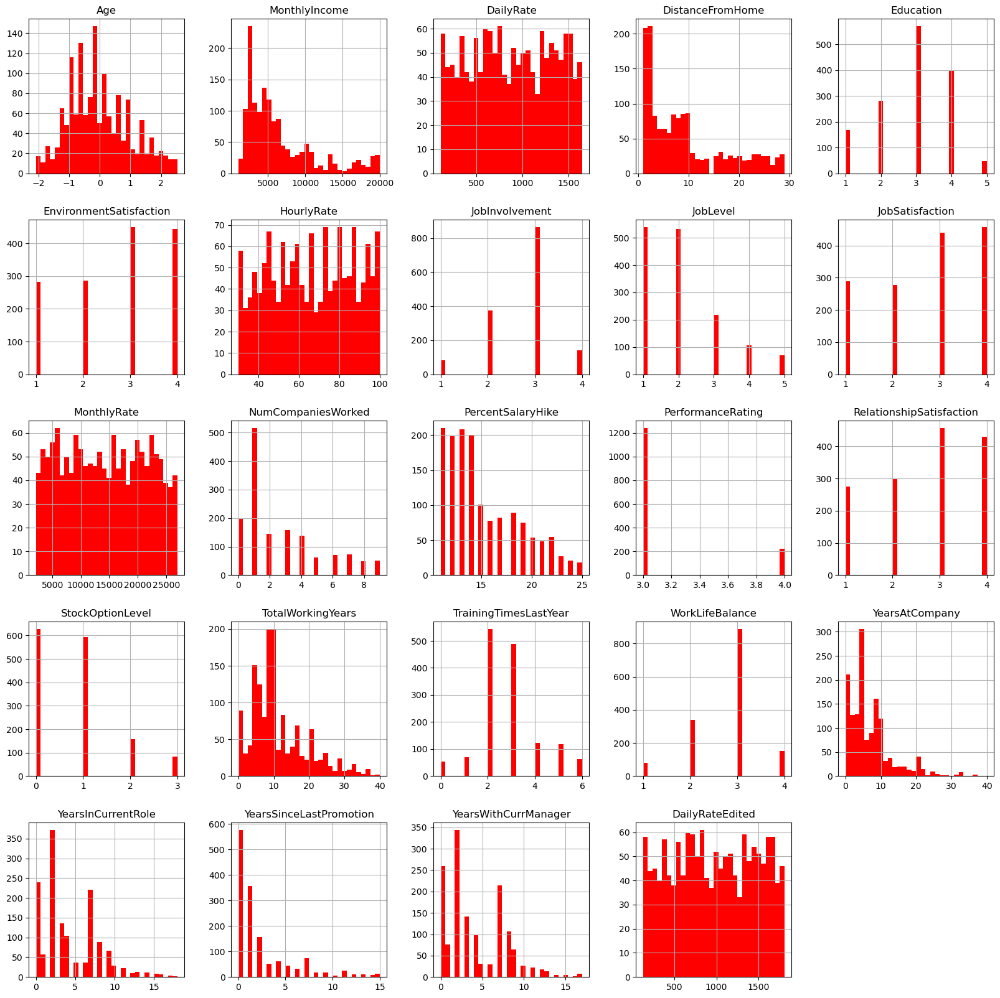

In [34]:
hr_df.hist(bins = 30, figsize = (20,20), color = 'r');

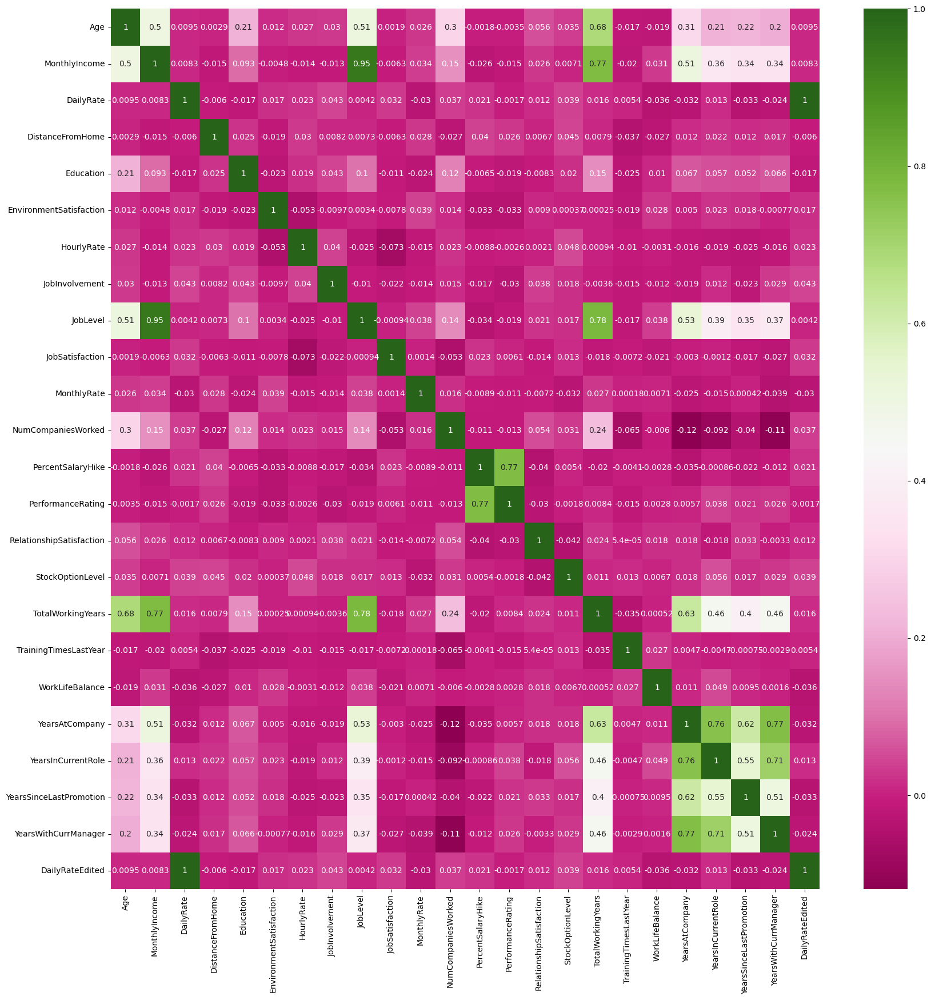

In [35]:
f, ax = plt.subplots(figsize = (20,20))
sns.heatmap(hr_df.corr(numeric_only = True), cmap = 'PiYG', annot = True);

## Data Visualization

### Matplotlib Pie Chart Plotting

In [36]:
crypto_df = pd.DataFrame(data = {'allocation_%': [20,55,5,17,3]}, index = ['BTC', 'ETH', 'LTC', 'XRP', 'ADA'])
crypto_df

,allocation_%
BTC,20
ETH,55
LTC,5
XRP,17
ADA,3


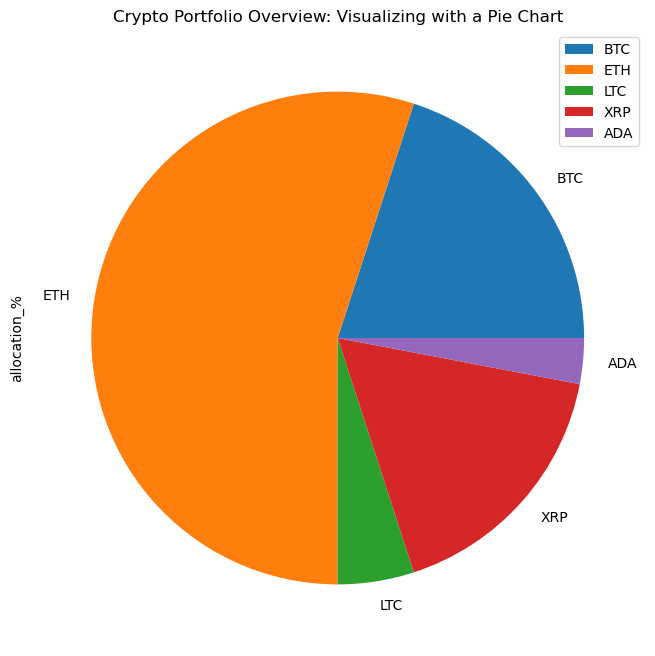

In [37]:
crypto_df.plot.pie(y = 'allocation_%', figsize = (8,8))
plt.title('Crypto Portfolio Overview: Visualizing with a Pie Chart');

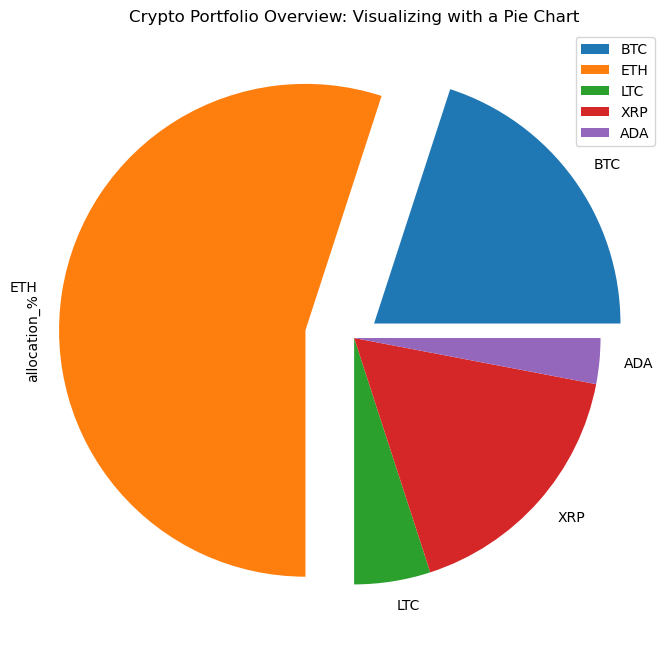

In [38]:
crypto_df.plot.pie(y = 'allocation_%', explode = (0.1,0.2,0,0,0), figsize = (8,8))
plt.title('Crypto Portfolio Overview: Visualizing with a Pie Chart');

### Matplotlib Single and Multiple Line Plots Rendering

In [39]:
investments_df.head()

,Date,BTC,ETH,ADA
0,9/17/2014,457.334015,NaN,NaN
1,9/18/2014,424.440002,NaN,NaN
2,9/19/2014,394.795990,NaN,NaN
3,9/20/2014,408.903992,NaN,NaN
4,9/21/2014,398.821014,NaN,NaN


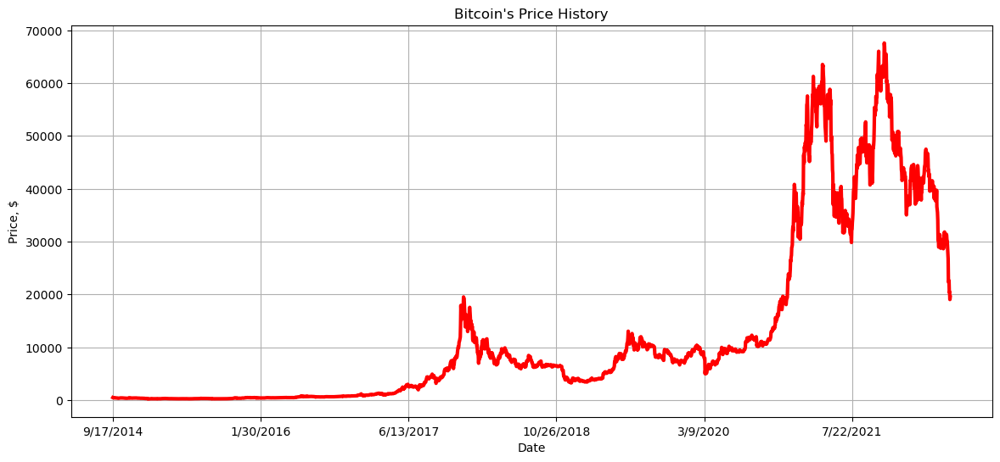

In [40]:
investments_df.plot(x = 'Date', y = 'BTC', color = 'r', linewidth = 3, figsize = (14, 6));
plt.ylabel('Price, $')
plt.title("Bitcoin's Price History")
plt.legend().set_visible(False)
plt.grid()

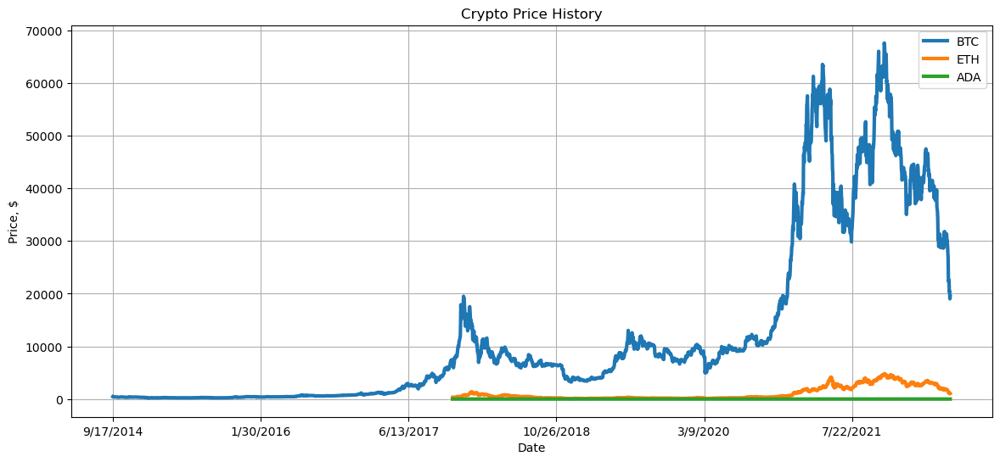

In [41]:
investments_df.plot(x = 'Date', y = ['BTC', 'ETH', 'ADA'], linewidth = 3, figsize = (14,6));
plt.ylabel('Price, $')
plt.title('Crypto Price History')
plt.grid()

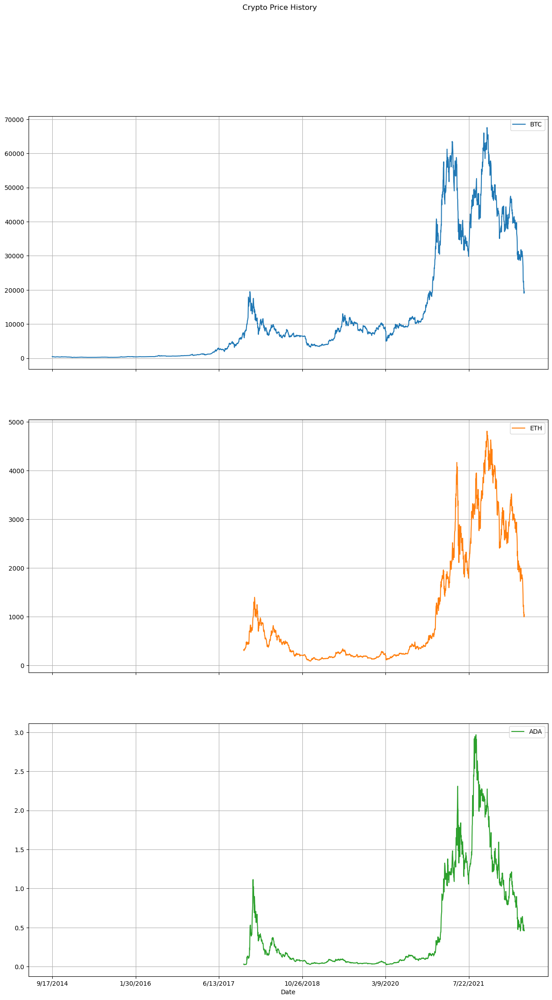

In [42]:
investments_df.plot(x = 'Date', title = 'Crypto Price History', subplots = True, grid = True, figsize = (15,25));

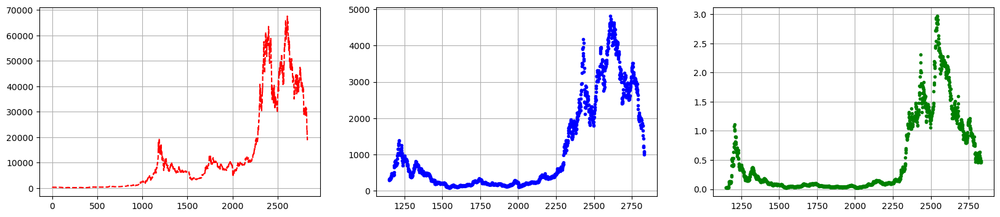

In [43]:
plt.figure(figsize = (20,4))
plt.subplot(1, 3, 1) # 1 row and 3 columns
plt.plot(investments_df['BTC'], 'r--');
plt.grid()
plt.subplot(1, 3, 2)
plt.plot(investments_df['ETH'], 'b.');
plt.grid()
plt.subplot(1, 3, 3)
plt.plot(investments_df['ADA'], 'g.');
plt.grid()

### Matplotlib Scatter Plots Rendering

In [44]:
daily_return_df.head()

,Date,BTC,ETH,ADA
0,9/17/2014,0.000000,0.0,0.0
1,9/18/2014,-7.192558,NaN,NaN
2,9/19/2014,-6.984264,NaN,NaN
3,9/20/2014,3.573492,NaN,NaN
4,9/21/2014,-2.465854,NaN,NaN


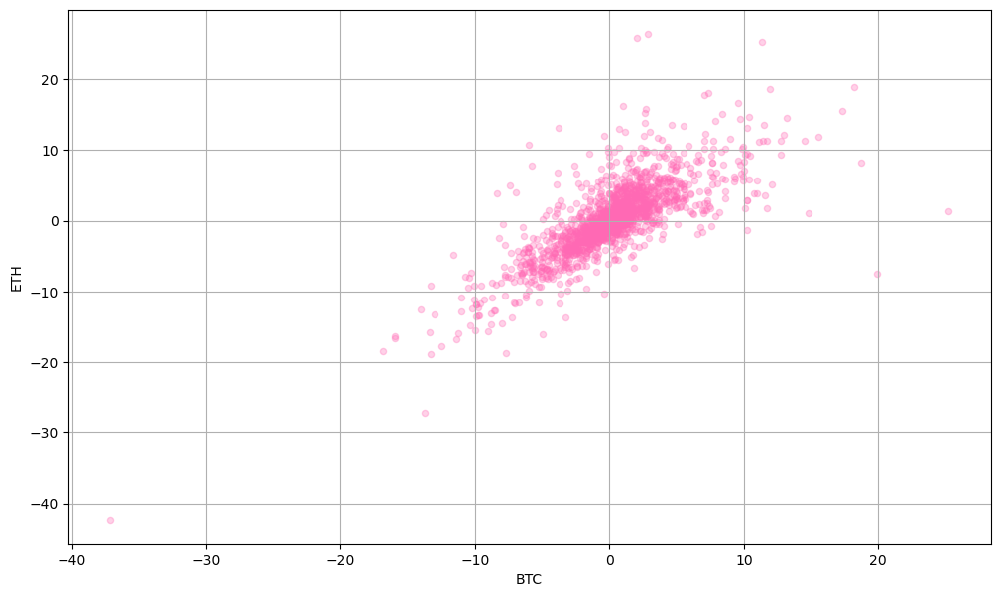

In [45]:
daily_return_df.plot.scatter('BTC', 'ETH', grid = True, figsize = (12,7), color = 'hotpink', alpha = 0.3);

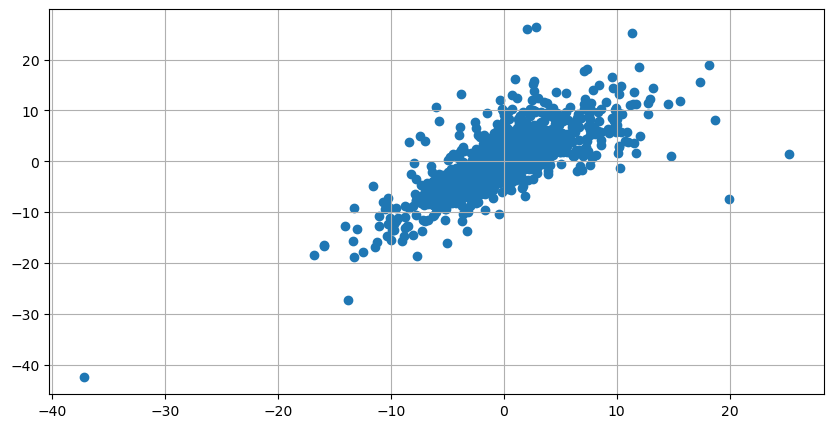

In [46]:
x = daily_return_df['BTC']
y = daily_return_df['ETH']
plt.figure(figsize = (10,5))
plt.scatter(x, y);
plt.grid()

### Matplotlib Histograms Plotting

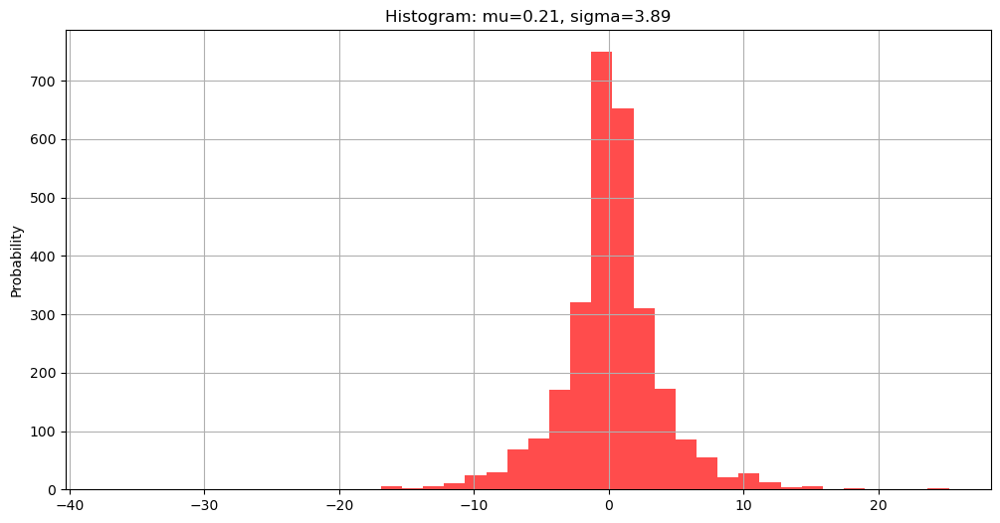

In [47]:
mu_btc = round(daily_return_df['BTC'].mean(), 2)
sigma_btc = round(daily_return_df['BTC'].std(), 2)
plt.figure(figsize = (20,15))
daily_return_df['BTC'].plot.hist(bins = 40, color = 'r', alpha = 0.7, figsize = (12,6))
plt.grid()
plt.ylabel('Probability')
plt.title('Histogram: mu=' + str(mu_btc) + ', sigma=' + str(sigma_btc));

<Figure size 2000x1500 with 0 Axes>

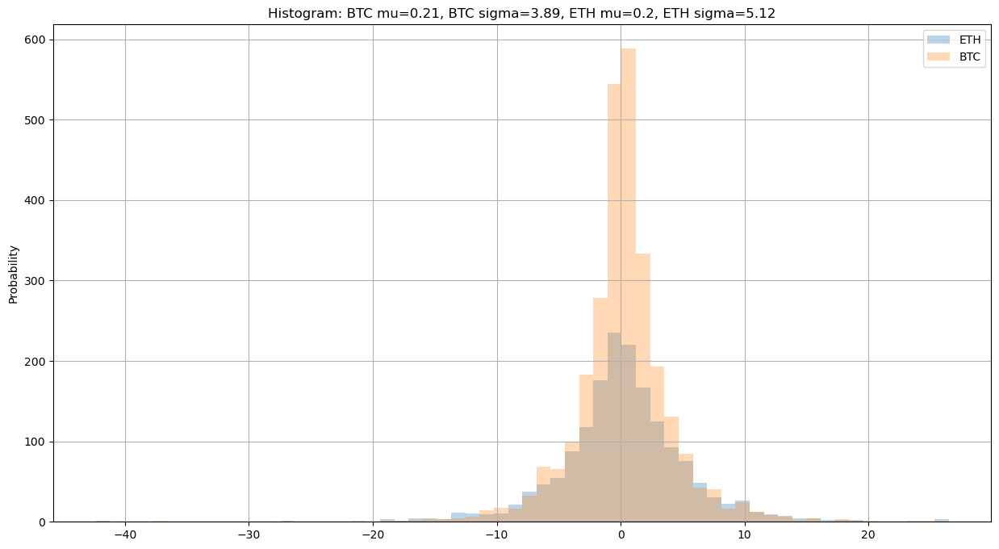

In [48]:
plt.figure(figsize = (20,15))
mu_btc = round(daily_return_df['BTC'].mean(), 2)
sigma_btc = round(daily_return_df['BTC'].std(), 2)
mu_eth = round(daily_return_df['ETH'].mean(), 2)
sigma_eth = round(daily_return_df['ETH'].std(), 2)
daily_return_df[['ETH', 'BTC']].plot.hist(bins = 60, alpha = 0.3, figsize = (15, 8))
plt.grid()
plt.ylabel('Probability')
plt.title('Histogram: BTC mu=' + str(mu_btc) + ', BTC sigma=' + str(sigma_btc) +
          ', ETH mu=' + str(mu_eth) + ', ETH sigma=' + str(sigma_eth));

### Seaborn Scatter and Count Plots Rendering

In [49]:
cancer_df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


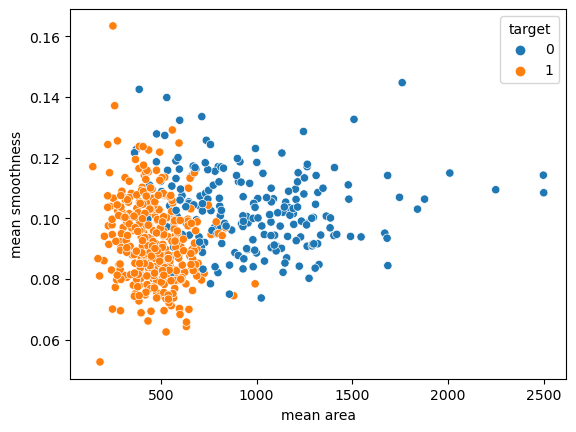

In [50]:
sns.scatterplot(x = 'mean area', y = 'mean smoothness', hue = 'target', data = cancer_df);

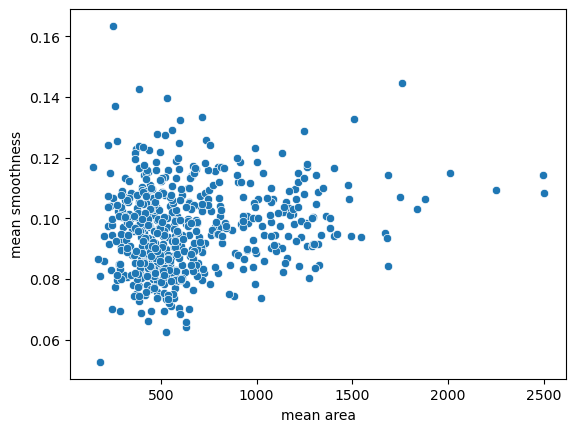

In [51]:
sns.scatterplot(x = 'mean area', y = 'mean smoothness', data = cancer_df);

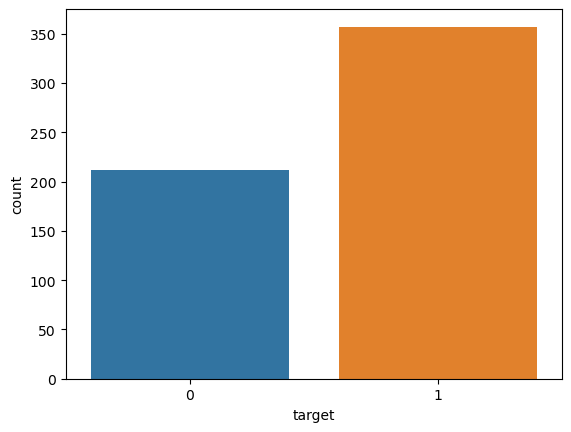

In [52]:
sns.countplot(x = cancer_df['target']);

### Seaborn Pairplot, Displot, and Heatmap Rendering

/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


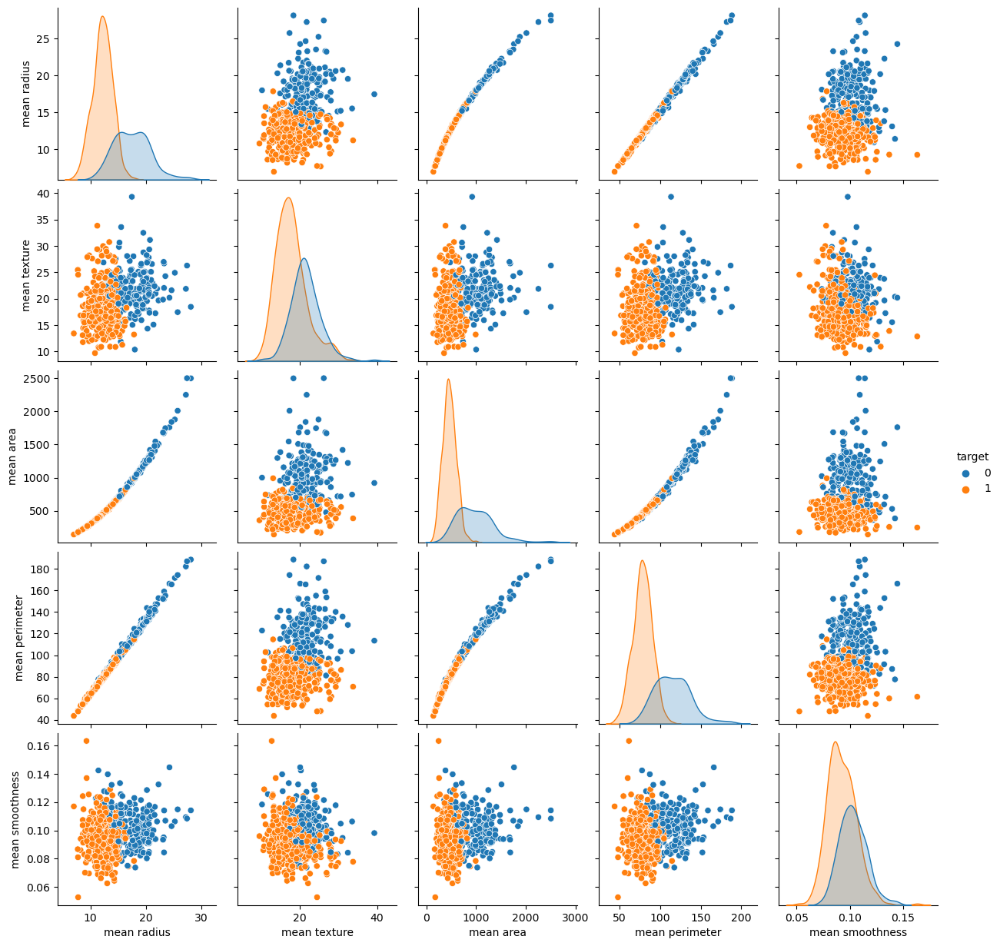

In [53]:
sns.pairplot(cancer_df, hue = 'target', vars = ['mean radius', 'mean texture', 'mean area', 'mean perimeter', 'mean smoothness']);

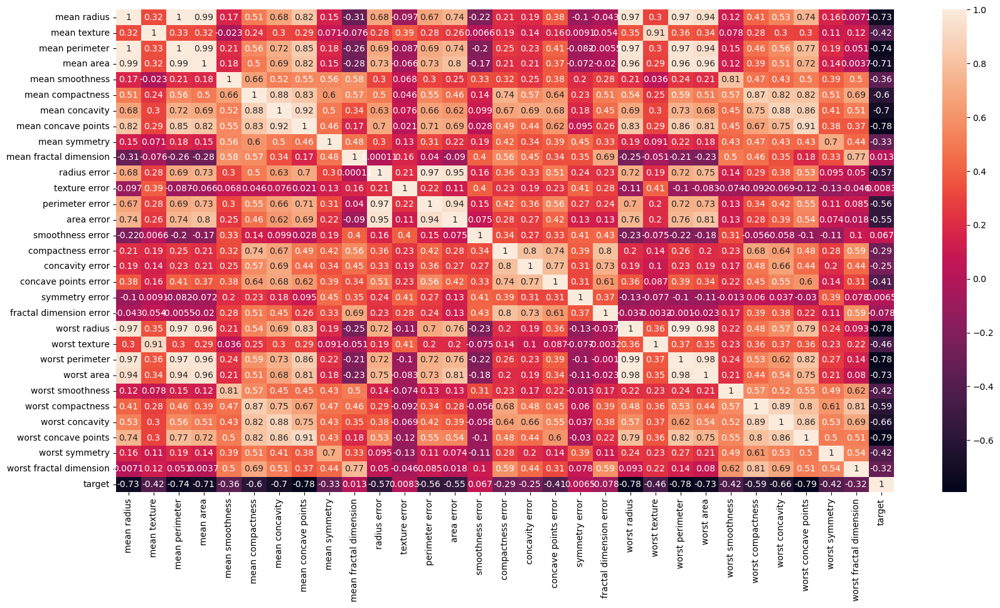

In [54]:
plt.figure(figsize = (20, 10))
sns.heatmap(cancer_df.corr(), annot = True);

/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


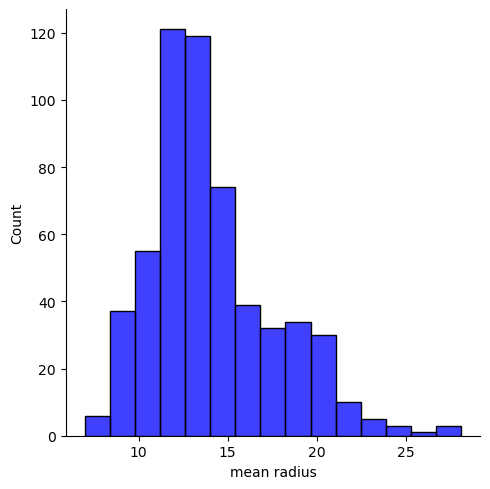

In [55]:
sns.displot(x = cancer_df['mean radius'], bins = 15, color = 'blue');

In [56]:
class_0_df = cancer_df[cancer_df['target'] == 0]
class_0_df

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
563,20.92,25.09,143.00,1347.0,0.10990,0.22360,0.31740,0.14740,0.2149,0.06879,...,29.41,179.10,1819.0,0.1407,0.4186,0.6599,0.2542,0.2929,0.09873,0
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.1410,0.2113,0.4107,0.2216,0.2060,0.07115,0
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.1166,0.1922,0.3215,0.1628,0.2572,0.06637,0
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.1139,0.3094,0.3403,0.1418,0.2218,0.07820,0


In [57]:
class_1_df = cancer_df[cancer_df['target'] == 1]
class_1_df

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
19,13.540,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.047810,0.1885,0.05766,...,19.26,99.70,711.2,0.14400,0.17730,0.23900,0.12880,0.2977,0.07259,1
20,13.080,15.71,85.63,520.0,0.10750,0.12700,0.04568,0.031100,0.1967,0.06811,...,20.49,96.09,630.5,0.13120,0.27760,0.18900,0.07283,0.3184,0.08183,1
21,9.504,12.44,60.34,273.9,0.10240,0.06492,0.02956,0.020760,0.1815,0.06905,...,15.66,65.13,314.9,0.13240,0.11480,0.08867,0.06227,0.2450,0.07773,1
37,13.030,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.029230,0.1467,0.05863,...,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169,1
46,8.196,16.84,51.71,201.9,0.08600,0.05943,0.01588,0.005917,0.1769,0.06503,...,21.96,57.26,242.2,0.12970,0.13570,0.06880,0.02564,0.3105,0.07409,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
558,14.590,22.68,96.39,657.1,0.08473,0.13300,0.10290,0.037360,0.1454,0.06147,...,27.27,105.90,733.5,0.10260,0.31710,0.36620,0.11050,0.2258,0.08004,1
559,11.510,23.93,74.52,403.5,0.09261,0.10210,0.11120,0.041050,0.1388,0.06570,...,37.16,82.28,474.2,0.12980,0.25170,0.36300,0.09653,0.2112,0.08732,1
560,14.050,27.15,91.38,600.4,0.09929,0.11260,0.04462,0.043040,0.1537,0.06171,...,33.17,100.20,706.7,0.12410,0.22640,0.13260,0.10480,0.2250,0.08321,1
561,11.200,29.37,70.67,386.0,0.07449,0.03558,0.00000,0.000000,0.1060,0.05502,...,38.30,75.19,439.6,0.09267,0.05494,0.00000,0.00000,0.1566,0.05905,1


/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x700 with 0 Axes>

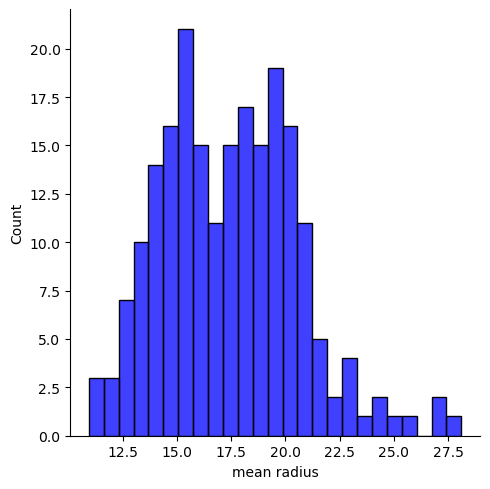

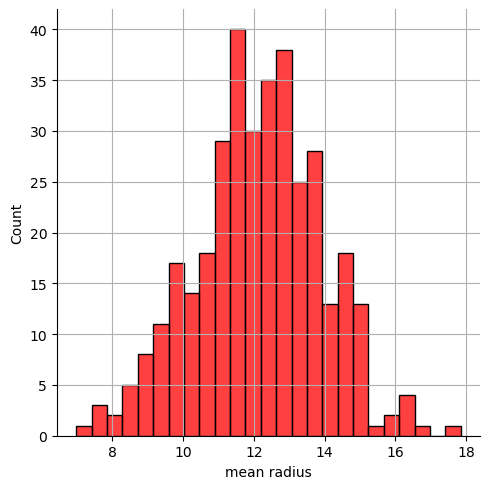

In [58]:
plt.figure(figsize = (10,7))
sns.displot(class_0_df['mean radius'], bins = 25, color = 'blue');
sns.displot(class_1_df['mean radius'], bins = 25, color = 'red');
plt.grid()

## Regression Analysis

### Conducting Exploratory Data Analysis - Part 1

In [59]:
uni_adm_df.head()

,GRE_Score,TOEFL_Score,University_Rating,SOP,LOR,CGPA,Research,Chance_of_Admission
0,337,118,4,4.5,4.5,9.65,1,0.92
1,324,107,4,4.0,4.5,8.87,1,0.76
2,316,104,3,3.0,3.5,8.00,1,0.72
3,322,110,3,3.5,2.5,8.67,1,0.80
4,314,103,2,2.0,3.0,8.21,0,0.65


In [60]:
uni_adm_df.tail()

,GRE_Score,TOEFL_Score,University_Rating,SOP,LOR,CGPA,Research,Chance_of_Admission
995,332,108,5,4.5,4.0,9.02,1,0.87
996,337,117,5,5.0,5.0,9.87,1,0.96
997,330,120,5,4.5,5.0,9.56,1,0.93
998,312,103,4,4.0,5.0,8.43,0,0.73
999,327,113,4,4.5,4.5,9.04,0,0.84


In [61]:
uni_adm_df.columns

Index(['GRE_Score', 'TOEFL_Score', 'University_Rating', 'SOP', 'LOR', 'CGPA',
       'Research', 'Chance_of_Admission'],
      dtype='object')

In [62]:
uni_adm_df.shape

(1000, 8)

In [63]:
uni_adm_df.isnull().sum()

GRE_Score              0
TOEFL_Score            0
University_Rating      0
SOP                    0
LOR                    0
CGPA                   0
Research               0
Chance_of_Admission    0
dtype: int64

In [64]:
uni_adm_df.dtypes

GRE_Score                int64
TOEFL_Score              int64
University_Rating        int64
SOP                    float64
LOR                    float64
CGPA                   float64
Research                 int64
Chance_of_Admission    float64
dtype: object

In [65]:
uni_adm_df.describe()

,GRE_Score,TOEFL_Score,University_Rating,SOP,LOR,CGPA,Research,Chance_of_Admission
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.00000
mean,316.472000,107.193000,3.114000,3.374000,3.484000,8.57644,0.560000,0.72174
std,11.289494,6.079368,1.142939,0.990507,0.924986,0.60451,0.496635,0.14107
min,290.000000,92.000000,1.000000,1.000000,1.000000,6.80000,0.000000,0.34000
25%,308.000000,103.000000,2.000000,2.500000,3.000000,8.12750,0.000000,0.63000
50%,317.000000,107.000000,3.000000,3.500000,3.500000,8.56000,1.000000,0.72000
75%,325.000000,112.000000,4.000000,4.000000,4.000000,9.04000,1.000000,0.82000
max,340.000000,120.000000,5.000000,5.000000,5.000000,9.92000,1.000000,0.97000


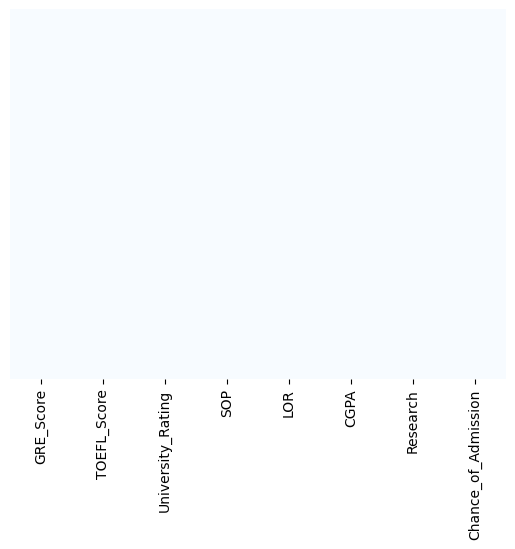

In [66]:
# to visually verify whether there are any missing values
sns.heatmap(uni_adm_df.isnull(), yticklabels = False, cbar = False, cmap = 'Blues');

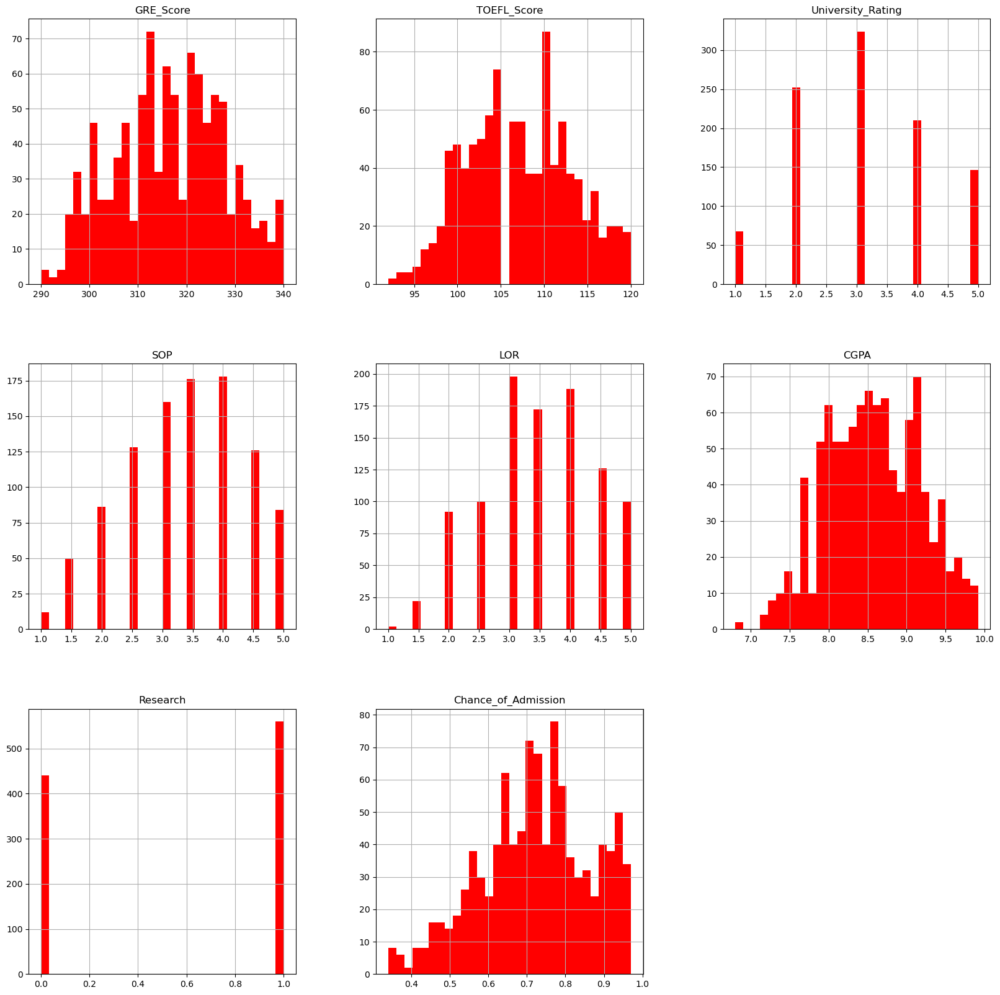

In [67]:
uni_adm_df.hist(bins = 30, figsize = (20,20), color = 'r');

/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


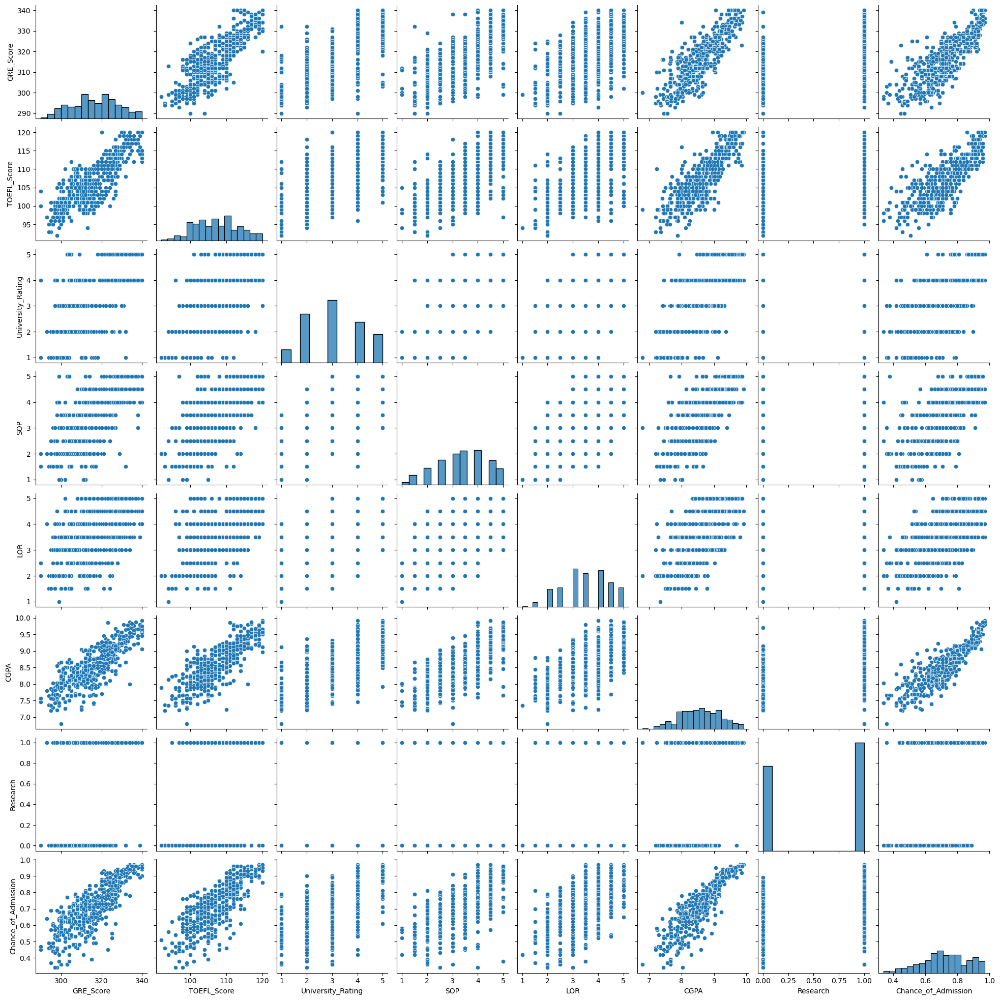

In [68]:
sns.pairplot(uni_adm_df);

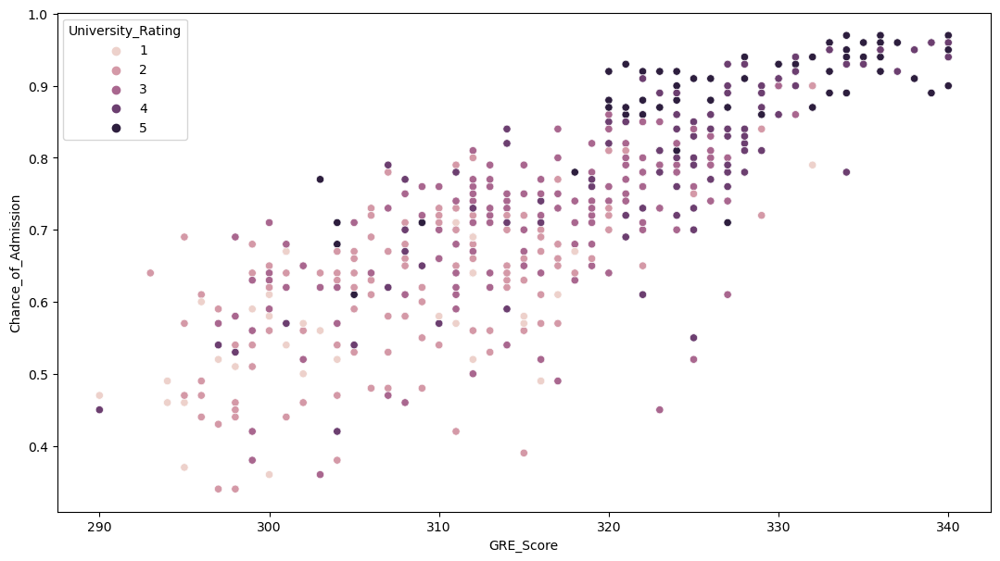

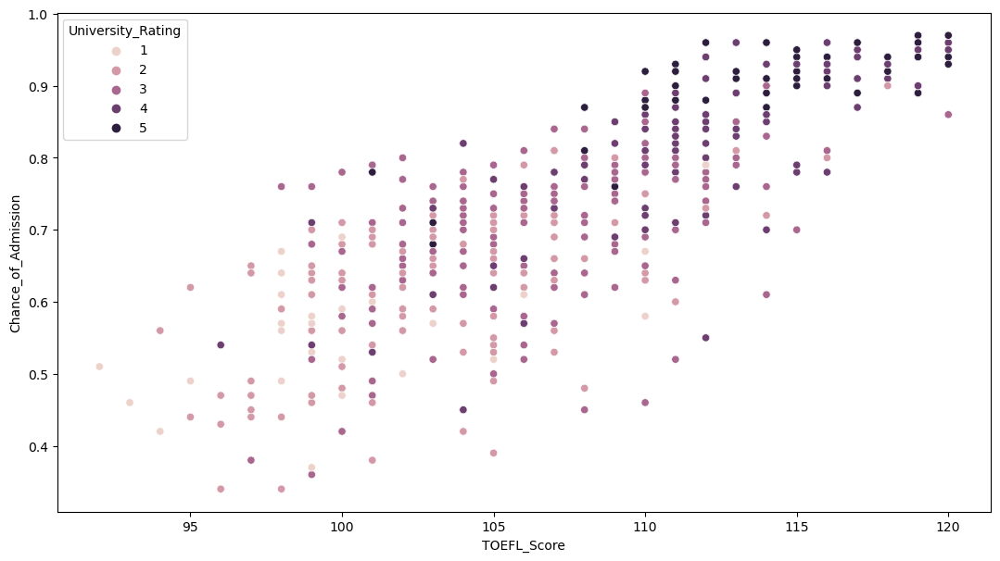

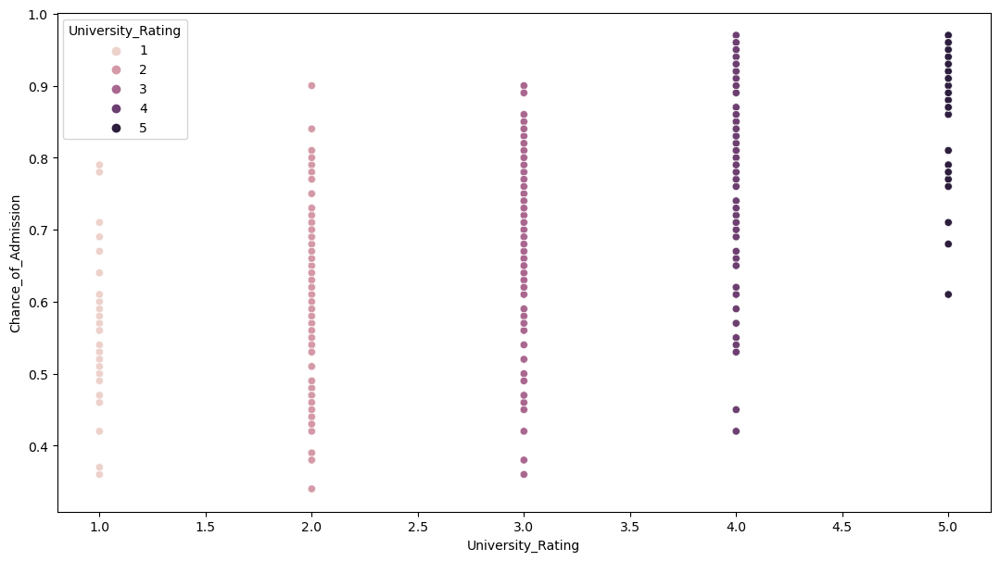

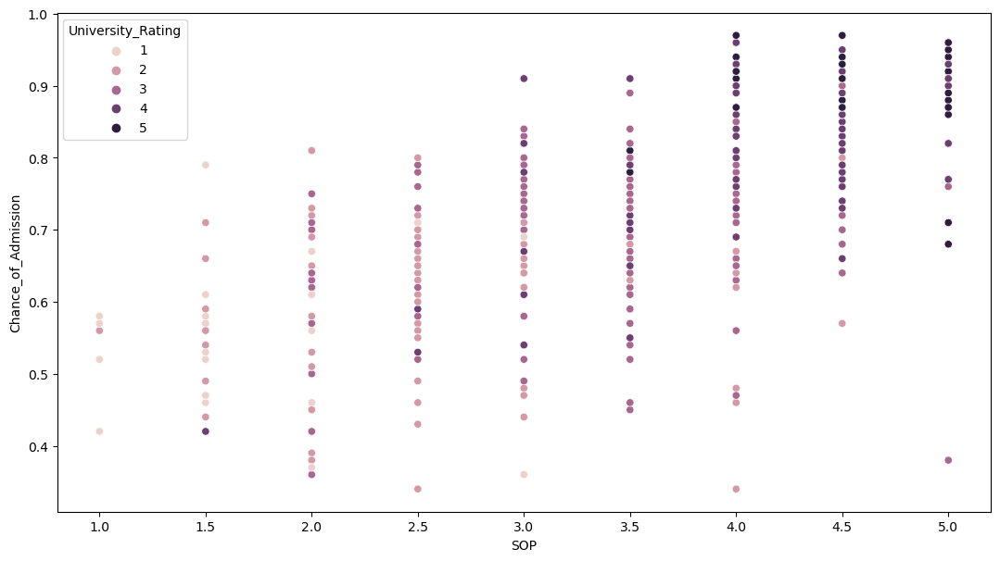

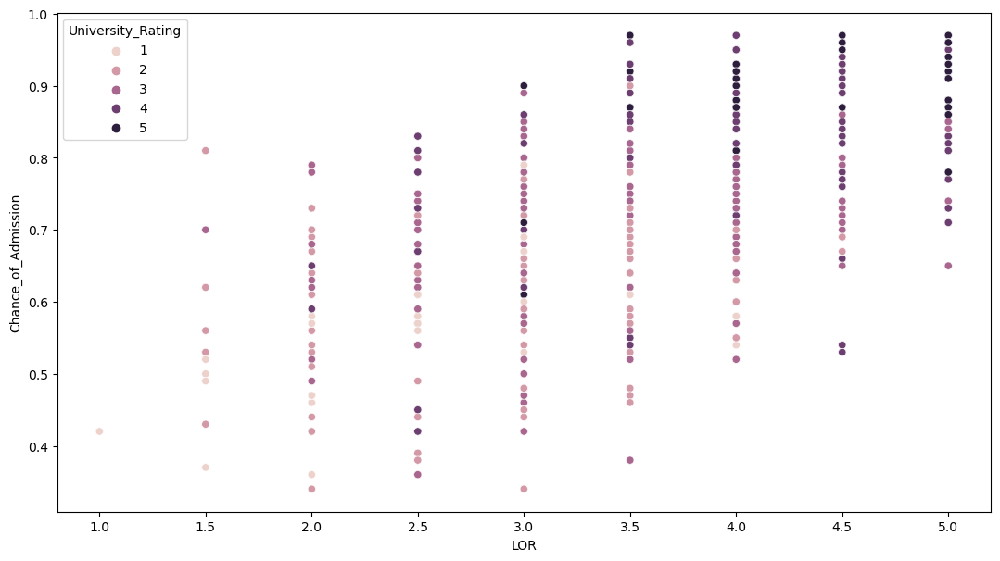

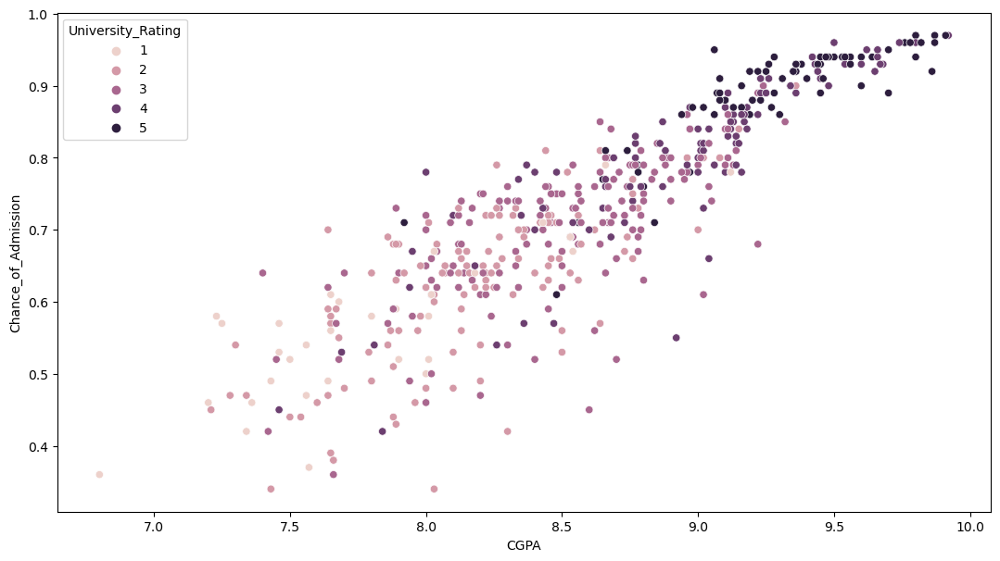

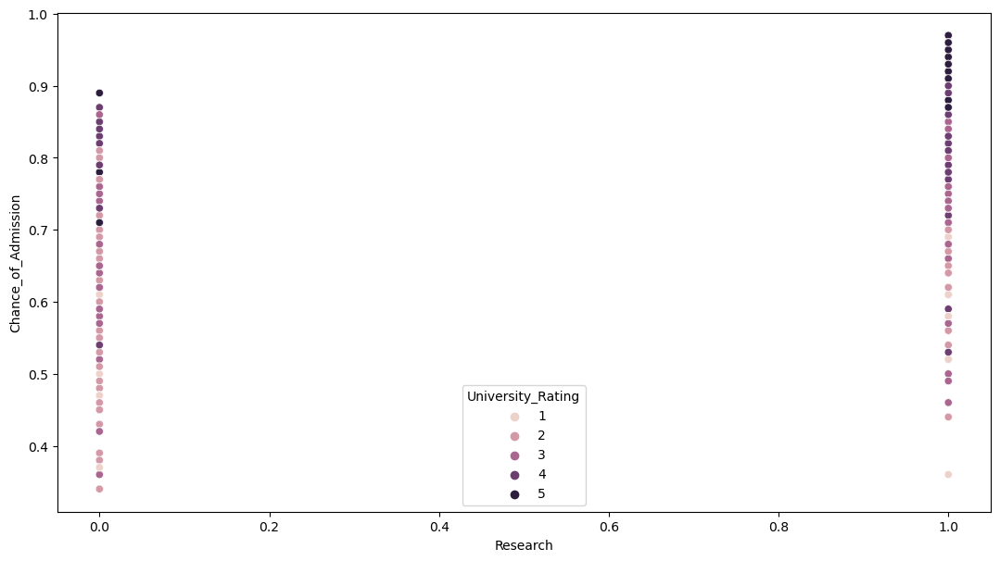

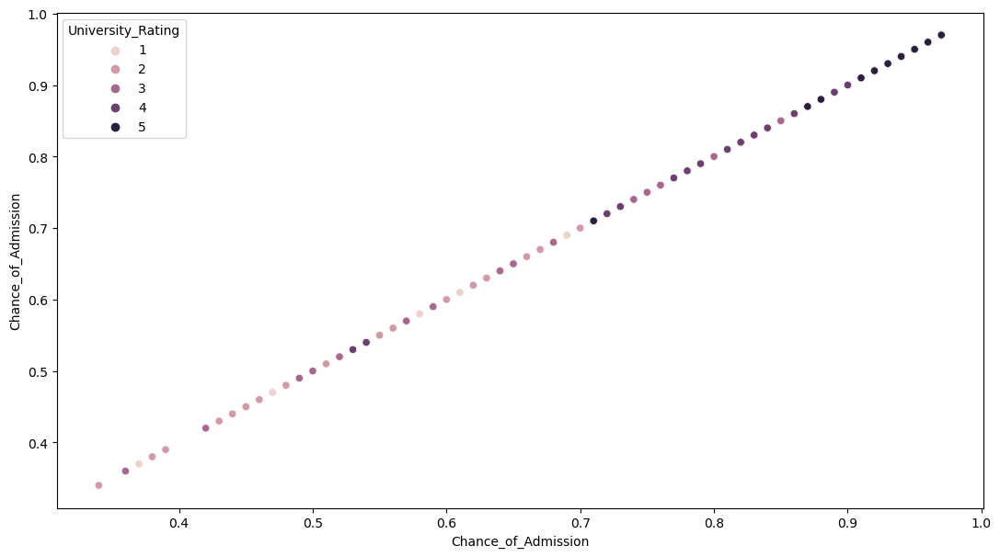

In [69]:
for i in uni_adm_df.columns:
  plt.figure(figsize = (13,7))
  sns.scatterplot(x = i, y = 'Chance_of_Admission', hue = "University_Rating",
                  hue_norm = (1,5), data = uni_adm_df)

In [70]:
uni_adm_df.corr()

,GRE_Score,TOEFL_Score,University_Rating,SOP,LOR,CGPA,Research,Chance_of_Admission
GRE_Score,1.000000,0.827076,0.635376,0.613498,0.524679,0.825878,0.563398,0.810351
TOEFL_Score,0.827076,1.000000,0.649725,0.644374,0.541340,0.810644,0.466453,0.791921
University_Rating,0.635376,0.649725,1.000000,0.728024,0.608651,0.705254,0.427047,0.690132
SOP,0.613498,0.644374,0.728024,1.000000,0.663707,0.712154,0.408116,0.684137
LOR,0.524679,0.541340,0.608651,0.663707,1.000000,0.637469,0.372526,0.645365
CGPA,0.825878,0.810644,0.705254,0.712154,0.637469,1.000000,0.501311,0.882413
Research,0.563398,0.466453,0.427047,0.408116,0.372526,0.501311,1.000000,0.545871
Chance_of_Admission,0.810351,0.791921,0.690132,0.684137,0.645365,0.882413,0.545871,1.000000


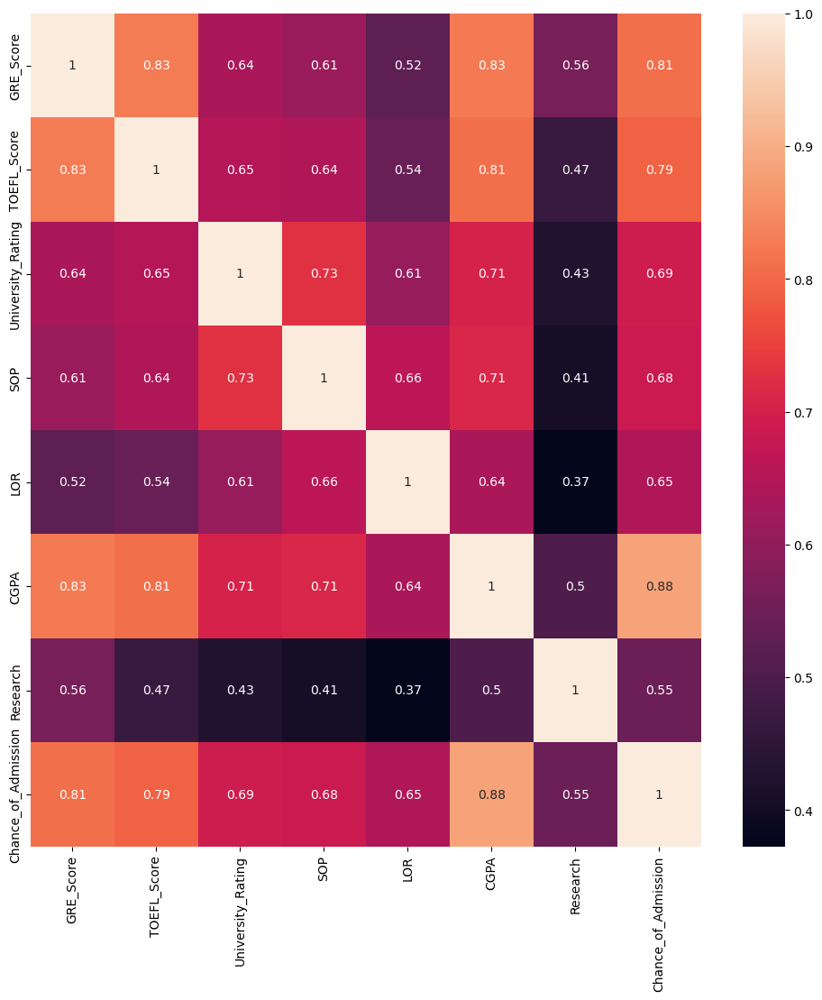

In [71]:
plt.figure(figsize = (12,12))
sns.heatmap(uni_adm_df.corr(), annot = True);

### Data Preprocessing for Model Training - Part 1

In [72]:
X = uni_adm_df.drop(columns = ['Chance_of_Admission'])
y = uni_adm_df['Chance_of_Admission']

In [73]:
X.shape

(1000, 7)

In [74]:
y.shape

(1000,)

In [75]:
X = np.array(X)
X

array([[337.  , 118.  ,   4.  , ...,   4.5 ,   9.65,   1.  ],
       [324.  , 107.  ,   4.  , ...,   4.5 ,   8.87,   1.  ],
       [316.  , 104.  ,   3.  , ...,   3.5 ,   8.  ,   1.  ],
       ...,
       [330.  , 120.  ,   5.  , ...,   5.  ,   9.56,   1.  ],
       [312.  , 103.  ,   4.  , ...,   5.  ,   8.43,   0.  ],
       [327.  , 113.  ,   4.  , ...,   4.5 ,   9.04,   0.  ]])

In [76]:
y = np.array(y)
y

array([0.92, 0.76, 0.72, 0.8 , 0.65, 0.9 , 0.75, 0.68, 0.5 , 0.45, 0.52,
       0.84, 0.78, 0.62, 0.61, 0.54, 0.66, 0.65, 0.63, 0.62, 0.64, 0.7 ,
       0.94, 0.95, 0.97, 0.94, 0.76, 0.44, 0.46, 0.54, 0.65, 0.74, 0.91,
       0.9 , 0.94, 0.88, 0.64, 0.58, 0.52, 0.48, 0.46, 0.49, 0.53, 0.87,
       0.91, 0.88, 0.86, 0.89, 0.82, 0.78, 0.76, 0.56, 0.78, 0.72, 0.7 ,
       0.64, 0.64, 0.46, 0.36, 0.42, 0.48, 0.47, 0.54, 0.56, 0.52, 0.55,
       0.61, 0.57, 0.68, 0.78, 0.94, 0.96, 0.93, 0.84, 0.74, 0.72, 0.74,
       0.64, 0.44, 0.46, 0.5 , 0.96, 0.92, 0.92, 0.94, 0.76, 0.72, 0.66,
       0.64, 0.74, 0.64, 0.38, 0.34, 0.44, 0.36, 0.42, 0.48, 0.86, 0.9 ,
       0.79, 0.71, 0.64, 0.62, 0.57, 0.74, 0.69, 0.87, 0.91, 0.93, 0.68,
       0.61, 0.69, 0.62, 0.72, 0.59, 0.66, 0.56, 0.45, 0.47, 0.71, 0.94,
       0.94, 0.57, 0.61, 0.57, 0.64, 0.85, 0.78, 0.84, 0.92, 0.96, 0.77,
       0.71, 0.79, 0.89, 0.82, 0.76, 0.71, 0.8 , 0.78, 0.84, 0.9 , 0.92,
       0.97, 0.8 , 0.81, 0.75, 0.83, 0.96, 0.79, 0.

In [77]:
y = y.reshape(-1,1) # to reshape the array from (1000,) to (1000,1)
y

array([[0.92],
       [0.76],
       [0.72],
       [0.8 ],
       [0.65],
       [0.9 ],
       [0.75],
       [0.68],
       [0.5 ],
       [0.45],
       [0.52],
       [0.84],
       [0.78],
       [0.62],
       [0.61],
       [0.54],
       [0.66],
       [0.65],
       [0.63],
       [0.62],
       [0.64],
       [0.7 ],
       [0.94],
       [0.95],
       [0.97],
       [0.94],
       [0.76],
       [0.44],
       [0.46],
       [0.54],
       [0.65],
       [0.74],
       [0.91],
       [0.9 ],
       [0.94],
       [0.88],
       [0.64],
       [0.58],
       [0.52],
       [0.48],
       [0.46],
       [0.49],
       [0.53],
       [0.87],
       [0.91],
       [0.88],
       [0.86],
       [0.89],
       [0.82],
       [0.78],
       [0.76],
       [0.56],
       [0.78],
       [0.72],
       [0.7 ],
       [0.64],
       [0.64],
       [0.46],
       [0.36],
       [0.42],
       [0.48],
       [0.47],
       [0.54],
       [0.56],
       [0.52],
       [0.55],
       [0.

In [78]:
y.shape

(1000, 1)

In [79]:
# Feature scaling is not required for XGBoost.


In [80]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.15)
X_train.shape

(850, 7)

In [81]:
X_test.shape

(150, 7)

In [82]:
# Scale the data before training the model. Feature scaling is not required for XGBoost.
# standard_scaler_X = StandardScaler()
# X = standard_scaler_X.fit_transform(X)
# standard_scaler_y = StandardScaler()
# y = standard_scaler_y.fit_transform(y)

### Training and Evaluating an XGBoost Algorithm - Part 1

In [83]:
model = xgb.XGBRegressor(objective = 'reg:squarederror', learning_rate = 0.1, max_depth = 2, n_estimators = 100)
model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=2, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [84]:
result = model.score(X_test, y_test)
print('Accuracy: {}'.format(result))

Accuracy: 0.8307556242382992


In [85]:
y_predict = model.predict(X_test)
y_predict
# Admission probabilities vary, with examples including 72%, 48%, and more.

array([0.49268022, 0.94380325, 0.7446139 , 0.8158556 , 0.8702816 ,
       0.88032526, 0.54556423, 0.57079166, 0.8964856 , 0.7991724 ,
       0.7012928 , 0.7514101 , 0.7683231 , 0.7717525 , 0.9165676 ,
       0.55137366, 0.6319764 , 0.74026024, 0.7135514 , 0.89082986,
       0.57273346, 0.68652713, 0.7880831 , 0.5531461 , 0.54384077,
       0.77776515, 0.9310403 , 0.94516927, 0.8486461 , 0.72800773,
       0.8418699 , 0.7153453 , 0.6030042 , 0.74512   , 0.905694  ,
       0.6496079 , 0.7664718 , 0.62071264, 0.65411687, 0.78916603,
       0.49730942, 0.8051605 , 0.81995755, 0.78916603, 0.7820022 ,
       0.9016943 , 0.8581899 , 0.8680764 , 0.6242925 , 0.5550591 ,
       0.67786837, 0.8982416 , 0.48571074, 0.7951172 , 0.76936775,
       0.5539237 , 0.6697142 , 0.77519315, 0.6643512 , 0.6030042 ,
       0.7908218 , 0.6489399 , 0.6784244 , 0.49843395, 0.84806573,
       0.7132044 , 0.7318485 , 0.8308169 , 0.72800773, 0.5905173 ,
       0.74425036, 0.58392197, 0.53564864, 0.669211  , 0.74568

In [86]:
RMSE = float(format(np.sqrt(mean_squared_error(y_test, y_predict)), '.3f'))
MSE = mean_squared_error(y_test, y_predict)
MAE = mean_absolute_error(y_test, y_predict)
r2 = r2_score(y_test, y_predict)
print('RMSE =', RMSE,
      '\nMSE =', MSE,
      '\nMAE =', MAE,
      '\nR2 =', r2)

RMSE = 0.057 
MSE = 0.0032127095702924463 
MAE = 0.03742149295012156 
R2 = 0.8307556242382992


### Conducting Exploratory Data Analysis - Part 2

In [87]:
life_expectancy_df.head()

,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


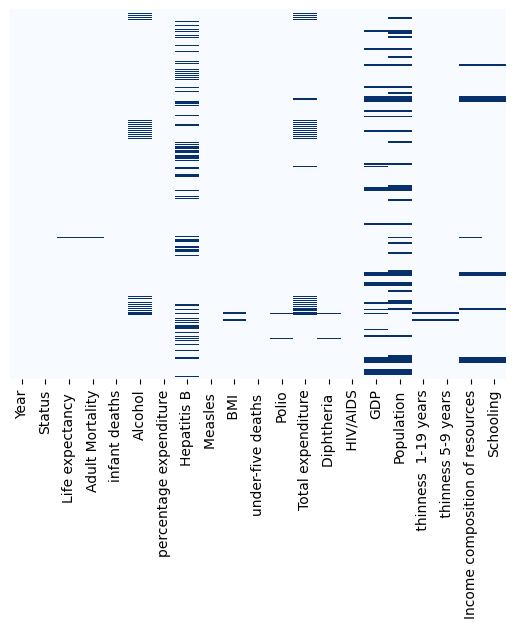

In [88]:
sns.heatmap(life_expectancy_df.isnull(), yticklabels = False, cbar = False, cmap = 'Blues');

In [89]:
life_expectancy_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Year                             2938 non-null   int64  
 1   Status                           2938 non-null   object 
 2   Life expectancy                  2928 non-null   float64
 3   Adult Mortality                  2928 non-null   float64
 4   infant deaths                    2938 non-null   int64  
 5   Alcohol                          2744 non-null   float64
 6   percentage expenditure           2938 non-null   float64
 7   Hepatitis B                      2385 non-null   float64
 8   Measles                          2938 non-null   int64  
 9    BMI                             2904 non-null   float64
 10  under-five deaths                2938 non-null   int64  
 11  Polio                            2919 non-null   float64
 12  Total expenditure   

In [90]:
life_expectancy_df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


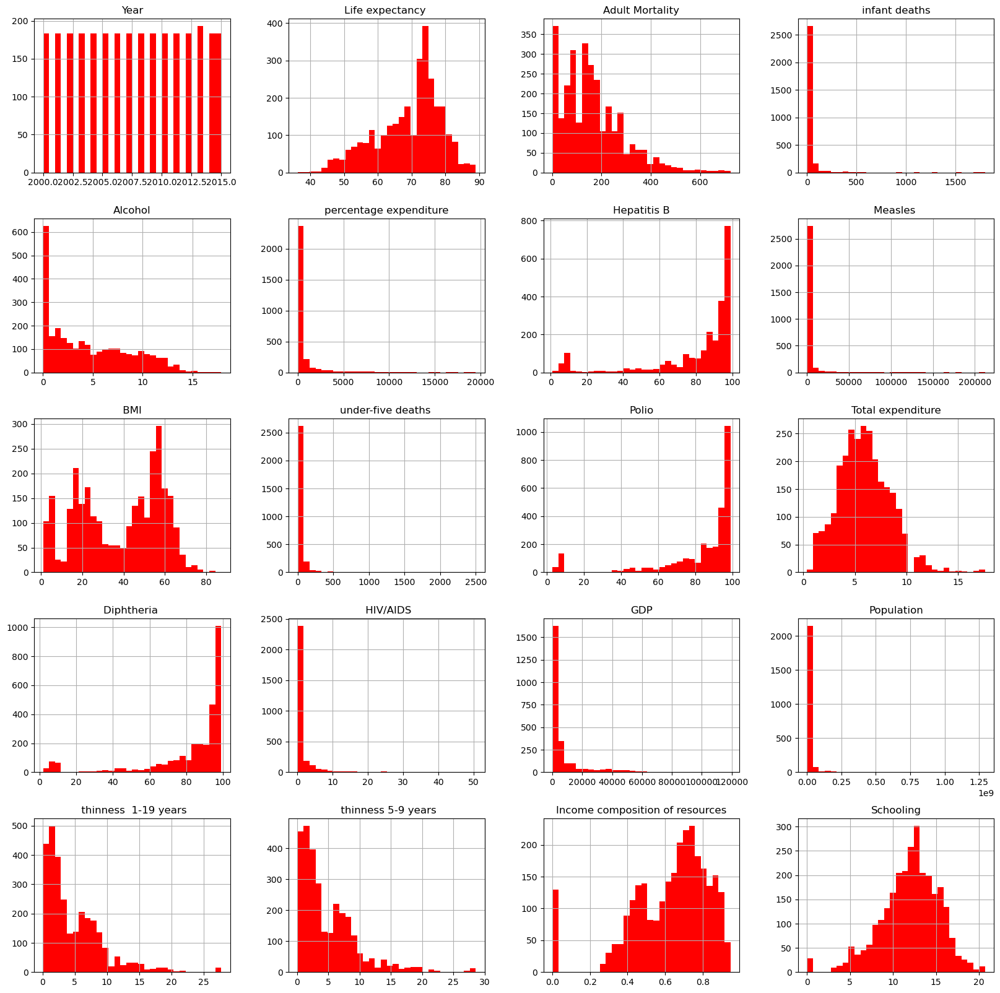

In [91]:
life_expectancy_df.hist(bins = 30, figsize = (20, 20), color = 'r');

/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 2000x2000 with 0 Axes>

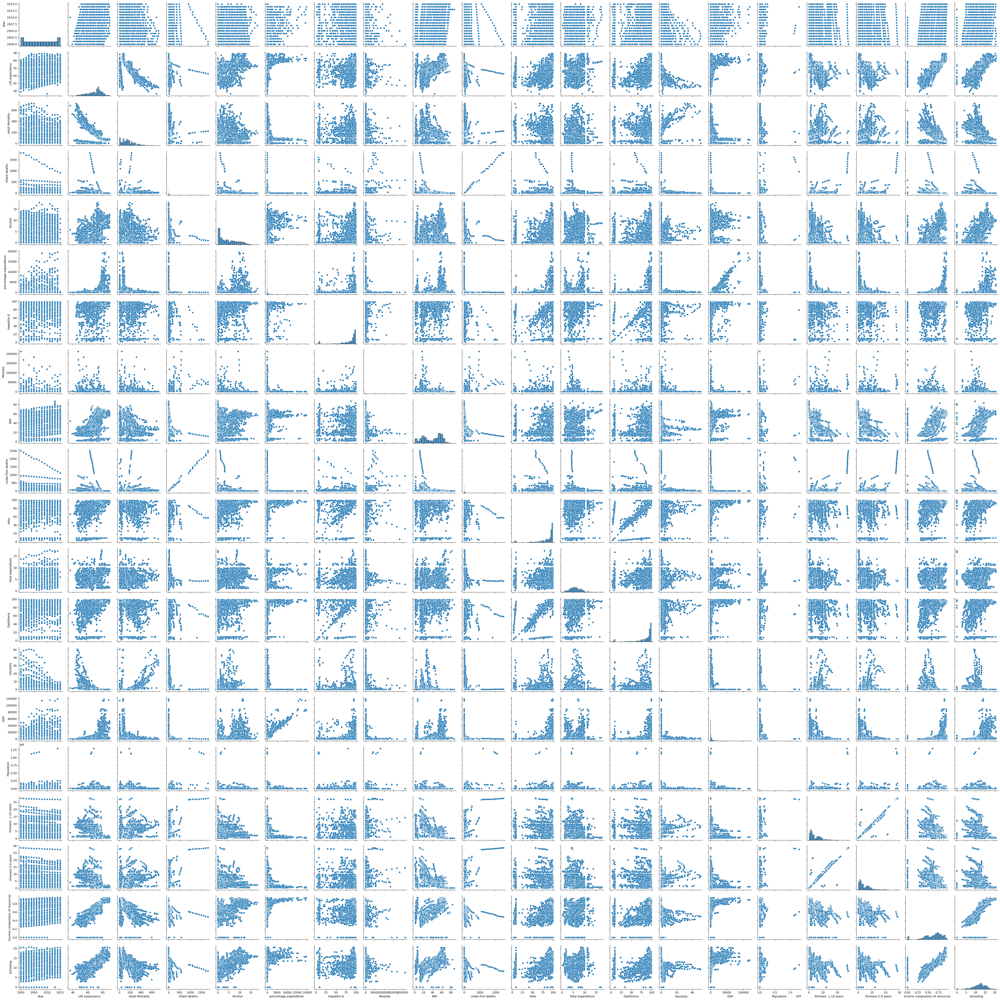

In [92]:
plt.figure(figsize = (20,20))
sns.pairplot(life_expectancy_df);

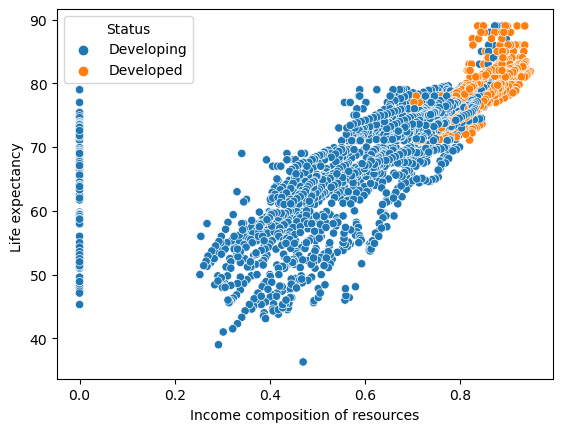

In [93]:
sns.scatterplot(x = 'Income composition of resources', y = 'Life expectancy ',
                hue = 'Status', data = life_expectancy_df);

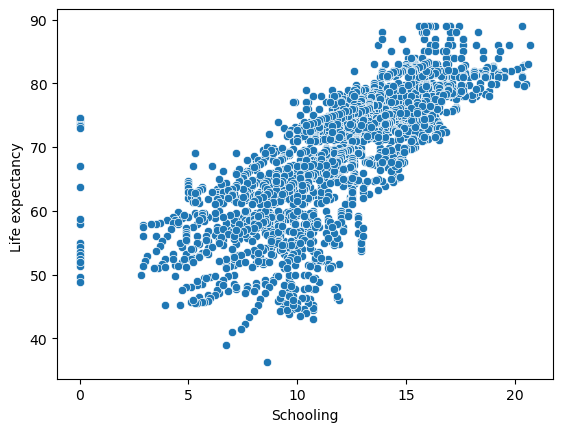

In [94]:
sns.scatterplot(x = 'Schooling', y = 'Life expectancy ', data = life_expectancy_df);

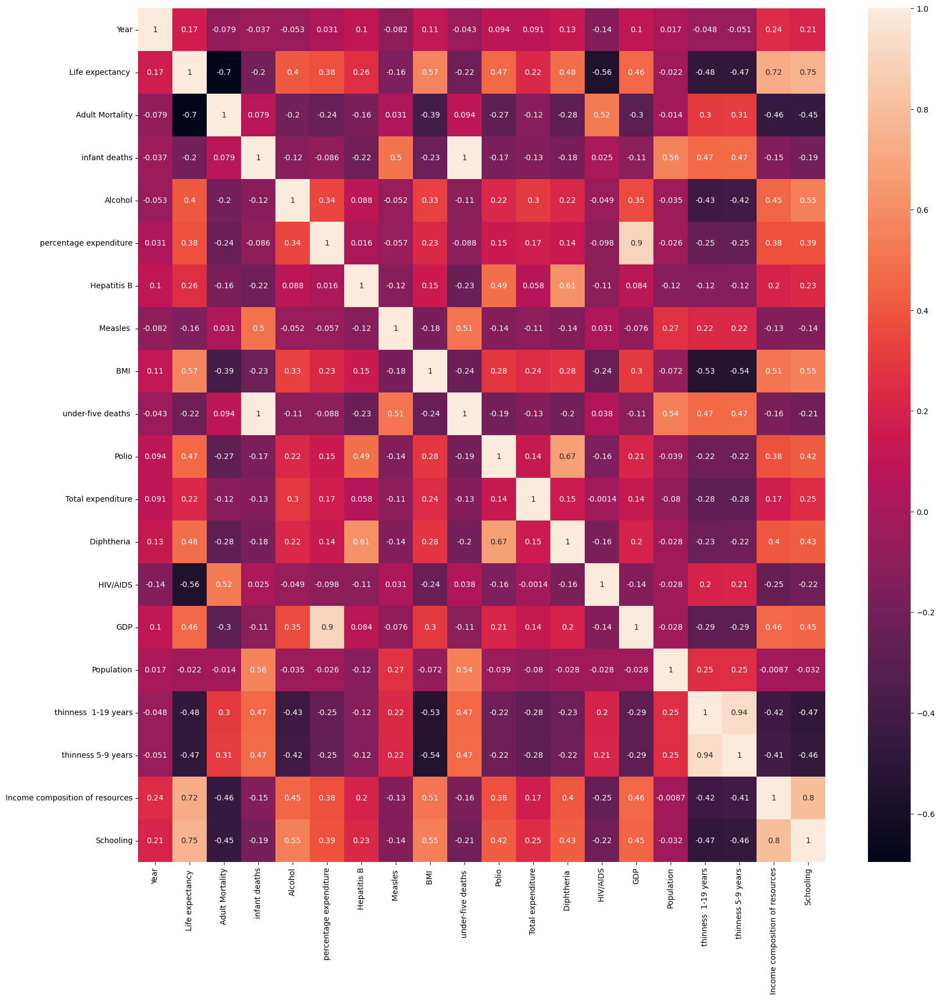

In [95]:
plt.figure(figsize = (20,20))
sns.heatmap(life_expectancy_df.corr(numeric_only = True), annot = True);

### Data Preprocessing for Model Training - Part 2

In [96]:
life_expectancy_df['Status'].nunique()

2

In [97]:
life_expectancy_df = pd.get_dummies(life_expectancy_df, columns = ['Status'])
life_expectancy_df

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,...,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status_Developed,Status_Developing
0,2015,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,...,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1,False,True
1,2014,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,...,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,False,True
2,2013,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,...,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,False,True
3,2012,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,...,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,False,True
4,2011,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,...,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2004,44.3,723.0,27,4.36,0.000000,68.0,31,27.1,42,...,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2,False,True
2934,2003,44.5,715.0,26,4.06,0.000000,7.0,998,26.7,41,...,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5,False,True
2935,2002,44.8,73.0,25,4.43,0.000000,73.0,304,26.3,40,...,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0,False,True
2936,2001,45.3,686.0,25,1.72,0.000000,76.0,529,25.9,39,...,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8,False,True


In [98]:
# to check the number of missing values for the columns with missing values
life_expectancy_df.isnull().sum()[np.where(life_expectancy_df.isnull().sum() != 0)[0]]

Life expectancy                     10
Adult Mortality                     10
Alcohol                            194
Hepatitis B                        553
 BMI                                34
Polio                               19
Total expenditure                  226
Diphtheria                          19
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

In [99]:
life_expectancy_df = life_expectancy_df.apply(lambda x: x.fillna(x.mean()), axis = 0)
life_expectancy_df.isnull().sum()[np.where(life_expectancy_df.isnull().sum() != 0)[0]]

Series([], dtype: int64)

In [100]:
X = life_expectancy_df.drop(columns = ['Life expectancy '])
X

,Year,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,...,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status_Developed,Status_Developing
0,2015,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,...,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1,False,True
1,2014,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,...,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,False,True
2,2013,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,...,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,False,True
3,2012,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,...,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,False,True
4,2011,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,...,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2004,723.0,27,4.36,0.000000,68.0,31,27.1,42,67.0,...,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2,False,True
2934,2003,715.0,26,4.06,0.000000,7.0,998,26.7,41,7.0,...,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5,False,True
2935,2002,73.0,25,4.43,0.000000,73.0,304,26.3,40,73.0,...,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0,False,True
2936,2001,686.0,25,1.72,0.000000,76.0,529,25.9,39,76.0,...,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8,False,True


In [101]:
X.shape

(2938, 21)

In [102]:
y = life_expectancy_df[['Life expectancy ']]
y

,Life expectancy
0,65.0
1,59.9
2,59.9
3,59.5
4,59.2
...,...
2933,44.3
2934,44.5
2935,44.8
2936,45.3


In [103]:
y.shape

(2938, 1)

In [104]:
type(X)

pandas.core.frame.DataFrame

In [105]:
X = np.array(X).astype('float32')
type(X)

numpy.ndarray

In [106]:
y = np.array(y).astype('float32')
y

array([[65. ],
       [59.9],
       [59.9],
       ...,
       [44.8],
       [45.3],
       [46. ]], dtype=float32)

In [107]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

### Training and Evaluating an XGBoost Algorithm - Part 2

In [108]:
model = xgb.XGBRegressor(objective = 'reg:squarederror', learning_rate = 0.1, max_depth = 30, n_estimators = 100)
model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=30, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [109]:
model_accuracy = model.score(X_test, y_test)
model_accuracy

0.9613005128482105

In [110]:
y_predict = model.predict(X_test)
y_predict

array([67.592964, 73.03973 , 71.98413 , 75.75558 , 48.377964, 71.586044,
       71.808365, 59.04754 , 54.47958 , 80.18016 , 55.29358 , 63.0069  ,
       60.001236, 77.34754 , 63.986267, 78.89894 , 73.5618  , 74.14501 ,
       58.85449 , 67.296814, 72.223656, 47.850876, 71.22925 , 52.1244  ,
       53.937534, 62.327896, 63.80918 , 68.305336, 48.361584, 80.20375 ,
       73.27934 , 73.97431 , 51.54756 , 75.96128 , 75.800896, 73.8565  ,
       73.0677  , 73.444435, 73.94627 , 63.326946, 64.67076 , 64.45365 ,
       81.93383 , 80.35529 , 72.42193 , 76.407295, 70.20239 , 81.05966 ,
       75.700226, 50.466908, 74.64477 , 83.75331 , 84.05027 , 65.44456 ,
       74.047485, 82.459915, 73.445274, 81.88082 , 72.84805 , 50.70047 ,
       53.660057, 62.12879 , 68.752495, 46.22715 , 66.963234, 54.106346,
       51.944714, 79.803665, 69.45862 , 73.16466 , 73.50673 , 72.81532 ,
       79.758224, 80.28039 , 52.631115, 59.252747, 73.046074, 72.48575 ,
       64.30495 , 69.75728 , 77.22832 , 72.708786, 

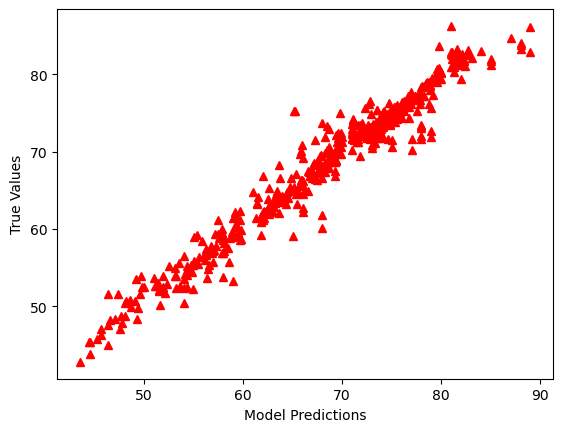

In [111]:
plt.plot(y_test, y_predict, "^", color = 'r')
plt.xlabel('Model Predictions')
plt.ylabel('True Values');
# The model performed well, as evidenced by a clear 45-degree line.

In [112]:
k = X_test.shape[1]
n = len(X_test)
RMSE = float(format(np.sqrt(mean_squared_error(y_test, y_predict)), '.3f'))
MSE = mean_squared_error(y_test, y_predict)
MAE = mean_absolute_error(y_test, y_predict)
r2 = r2_score(y_test, y_predict)
adj_r2 = 1-(1-r2)*(n-1)/(n-k-1)
print('RMSE =', RMSE,
      '\nMSE =', MSE,
      '\nMAE =', MAE,
      '\nR2 =', r2,
      '\nAdjusted R2 =', adj_r2)

RMSE = 1.834 
MSE = 3.3626826 
MAE = 1.1416394 
R2 = 0.9613005128482105 
Adjusted R2 = 0.959864666151766


## Classification Analysis
    
### Conducting Exploratory Data Analysis - Part 1

In [113]:
telecom_df.head()

,state,account_length,area_code,phone_number,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,class
0,16,128,415,2845,0,1,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,35,107,415,2301,0,1,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,31,137,415,1616,0,0,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,35,84,408,2510,1,0,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,36,75,415,155,1,0,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


In [114]:
telecom_df.tail()

,state,account_length,area_code,phone_number,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,class
4995,11,50,408,2000,0,1,40,235.7,127,40.07,...,126,18.96,297.5,116,13.39,9.9,5,2.67,2,0
4996,49,152,415,394,0,0,0,184.2,90,31.31,...,73,21.83,213.6,113,9.61,14.7,2,3.97,3,1
4997,7,61,415,313,0,0,0,140.6,89,23.90,...,128,14.69,212.4,97,9.56,13.6,4,3.67,1,0
4998,7,109,510,3471,0,0,0,188.8,67,32.10,...,92,14.59,224.4,89,10.10,8.5,6,2.30,0,0
4999,46,86,415,2412,0,1,34,129.4,102,22.00,...,104,22.70,154.8,100,6.97,9.3,16,2.51,0,0


In [115]:
telecom_df.shape

(5000, 21)

In [116]:
telecom_df.columns

Index(['state', 'account_length', 'area_code', 'phone_number',
       'international_plan', 'voice_mail_plan', 'number_vmail_messages',
       'total_day_minutes', 'total_day_calls', 'total_day_charge',
       'total_eve_minutes', 'total_eve_calls', 'total_eve_charge',
       'total_night_minutes', 'total_night_calls', 'total_night_charge',
       'total_intl_minutes', 'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'class'],
      dtype='object')

In [117]:
telecom_df.dtypes

state                              int64
account_length                     int64
area_code                          int64
phone_number                       int64
international_plan                 int64
voice_mail_plan                    int64
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
class                              int64
dtype: object

In [118]:
telecom_df.describe()

,state,account_length,area_code,phone_number,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,class
count,5000.00000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,...,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,25.99840,100.25860,436.911400,2499.500000,0.094600,0.264600,7.755200,180.288900,100.029400,30.649668,...,100.191000,17.054322,200.391620,99.919200,9.017732,10.261780,4.435200,2.771196,1.570400,0.141400
std,14.80348,39.69456,42.209182,1443.520003,0.292691,0.441164,13.546393,53.894699,19.831197,9.162069,...,19.826496,4.296843,50.527789,19.958686,2.273763,2.761396,2.456788,0.745514,1.306363,0.348469
min,0.00000,1.00000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,13.00000,73.00000,408.000000,1249.750000,0.000000,0.000000,0.000000,143.700000,87.000000,24.430000,...,87.000000,14.140000,166.900000,87.000000,7.510000,8.500000,3.000000,2.300000,1.000000,0.000000
50%,26.00000,100.00000,415.000000,2499.500000,0.000000,0.000000,0.000000,180.100000,100.000000,30.620000,...,100.000000,17.090000,200.400000,100.000000,9.020000,10.300000,4.000000,2.780000,1.000000,0.000000
75%,39.00000,127.00000,415.000000,3749.250000,0.000000,1.000000,17.000000,216.200000,113.000000,36.750000,...,114.000000,19.900000,234.700000,113.000000,10.560000,12.000000,6.000000,3.240000,2.000000,0.000000
max,50.00000,243.00000,510.000000,4999.000000,1.000000,1.000000,52.000000,351.500000,165.000000,59.760000,...,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000,1.000000


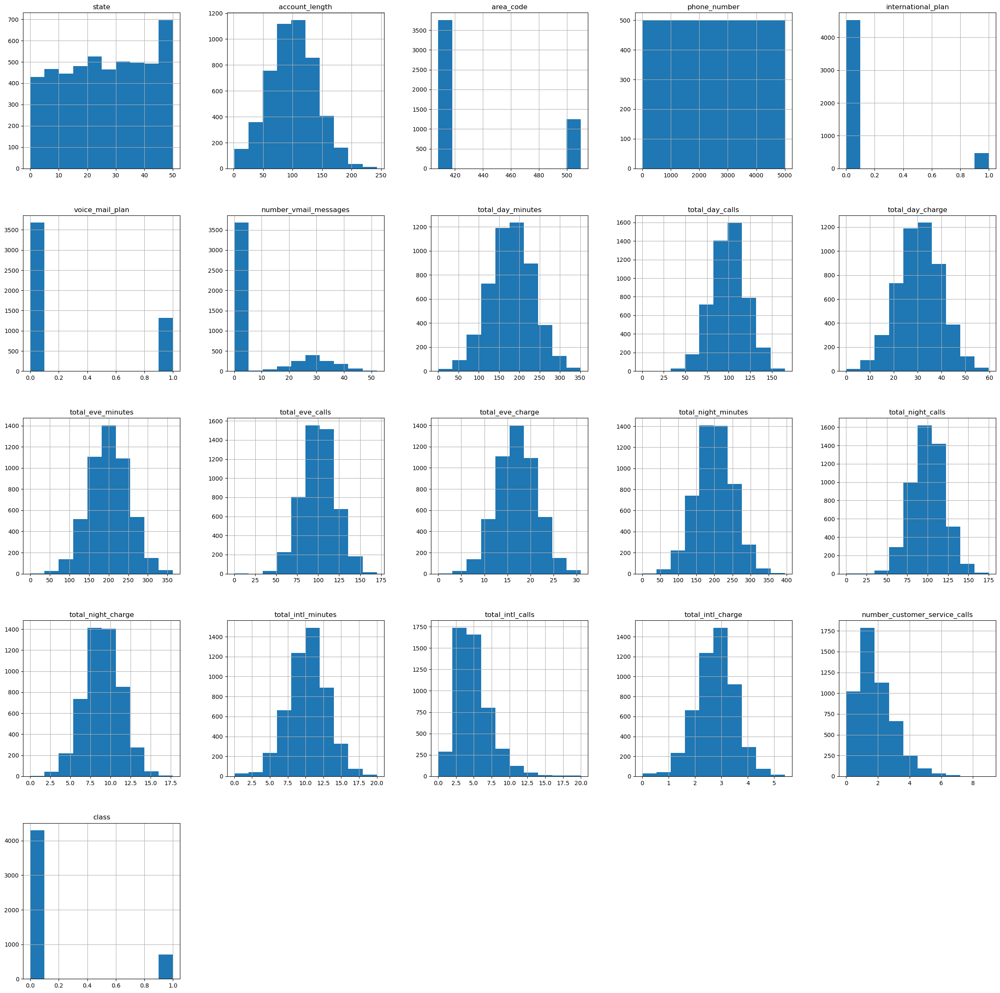

In [119]:
telecom_df.hist(figsize = (30,30));

In [120]:
telecom_df['class'].value_counts()

class
0    4293
1     707
Name: count, dtype: int64

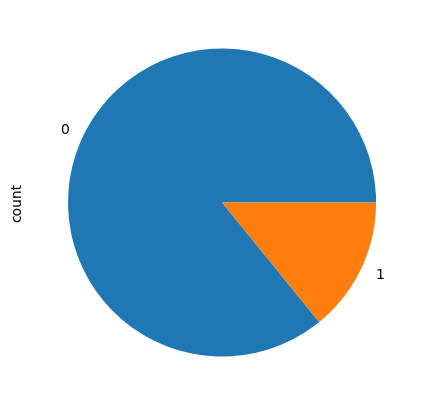

In [121]:
plt.figure(figsize = (5,5))
telecom_df['class'].value_counts().plot(kind = 'pie');

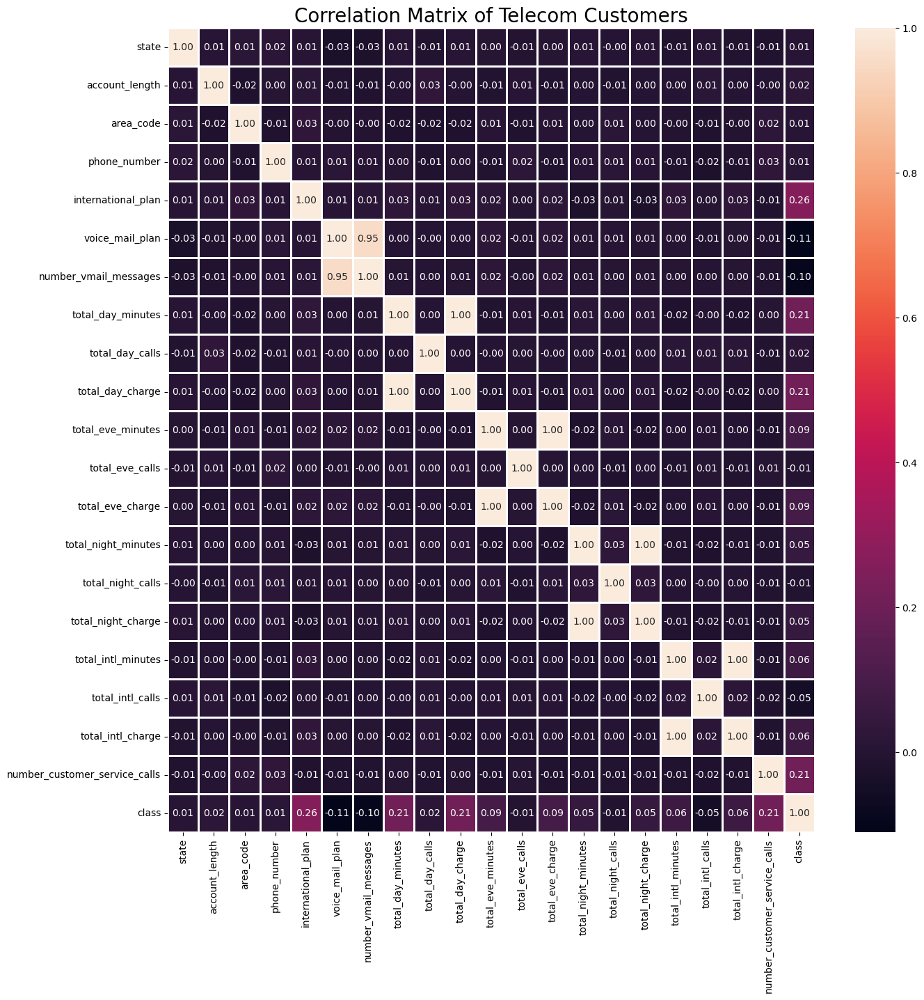

In [122]:
corr_matrix = telecom_df.corr()
plt.figure(figsize = (15,15))
cm = sns.heatmap(corr_matrix, linewidths = 1, annot = True, fmt = '.2f')
plt.title('Correlation Matrix of Telecom Customers', fontsize = 20);

/var/folders/vk/sc311by57qz3bv_c1c3h0bc40000gn/T/ipykernel_45305/244385798.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  ax = sns.kdeplot(telecom_df.total_day_charge[(telecom_df['class'] == 0)],
/var/folders/vk/sc311by57qz3bv_c1c3h0bc40000gn/T/ipykernel_45305/244385798.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  ax = sns.kdeplot(telecom_df.total_day_charge[(telecom_df['class'] == 1)],


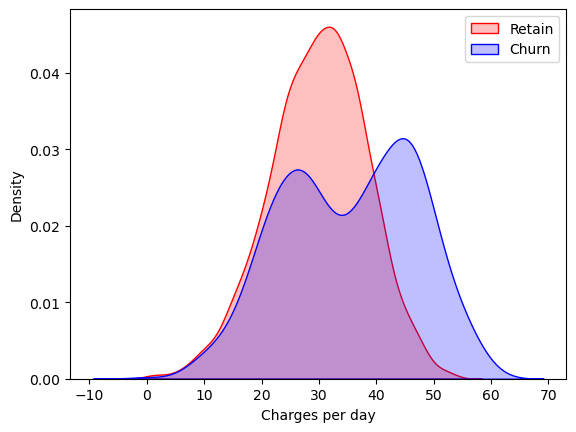

In [123]:
ax = sns.kdeplot(telecom_df.total_day_charge[(telecom_df['class'] == 0)],
                 color = 'Red', shade = True)
ax = sns.kdeplot(telecom_df.total_day_charge[(telecom_df['class'] == 1)],
                 color = 'Blue', shade = True)
ax.legend(['Retain', 'Churn'], loc = 'upper right')
ax.set_ylabel('Density')
ax.set_xlabel('Charges per day');

/var/folders/vk/sc311by57qz3bv_c1c3h0bc40000gn/T/ipykernel_45305/472453898.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  ax = sns.kdeplot(telecom_df.total_eve_charge[(telecom_df['class'] == 0)],
/var/folders/vk/sc311by57qz3bv_c1c3h0bc40000gn/T/ipykernel_45305/472453898.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  ax = sns.kdeplot(telecom_df.total_eve_charge[(telecom_df['class'] == 1)],


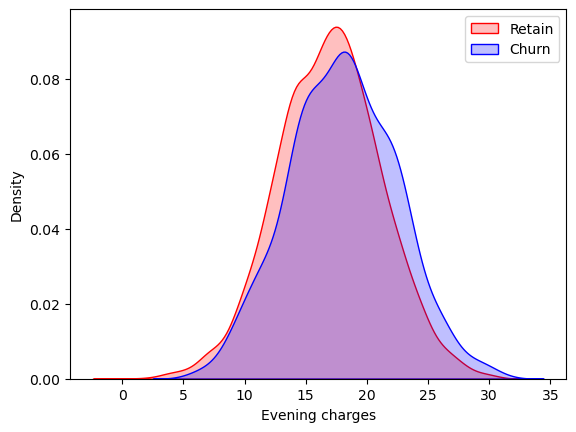

In [124]:
ax = sns.kdeplot(telecom_df.total_eve_charge[(telecom_df['class'] == 0)],
                 color = 'Red', shade = True)
ax = sns.kdeplot(telecom_df.total_eve_charge[(telecom_df['class'] == 1)],
                 color = 'Blue', shade = True)
ax.legend(['Retain', 'Churn'], loc = 'upper right')
ax.set_ylabel('Density')
ax.set_xlabel('Evening charges');

### Data Preprocessing for Model Training - Part 1

In [125]:
# area_code and phone_number features are irrelevant
X = telecom_df.drop(['class', 'area_code', 'phone_number'], axis = 'columns')
X.shape

(5000, 18)

In [126]:
y = telecom_df['class']
y.shape

(5000,)

In [127]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [128]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train.values.ravel())

RandomForestClassifier()

In [129]:
feat_scores = pd.DataFrame({'Fraction of variables affected': rf.feature_importances_}, index = X.columns)
feat_scores

,Fraction of variables affected
state,0.024480
account_length,0.025669
international_plan,0.076860
voice_mail_plan,0.021945
number_vmail_messages,0.025443
total_day_minutes,0.149553
total_day_calls,0.027319
total_day_charge,0.135419
total_eve_minutes,0.058295
total_eve_calls,0.026206


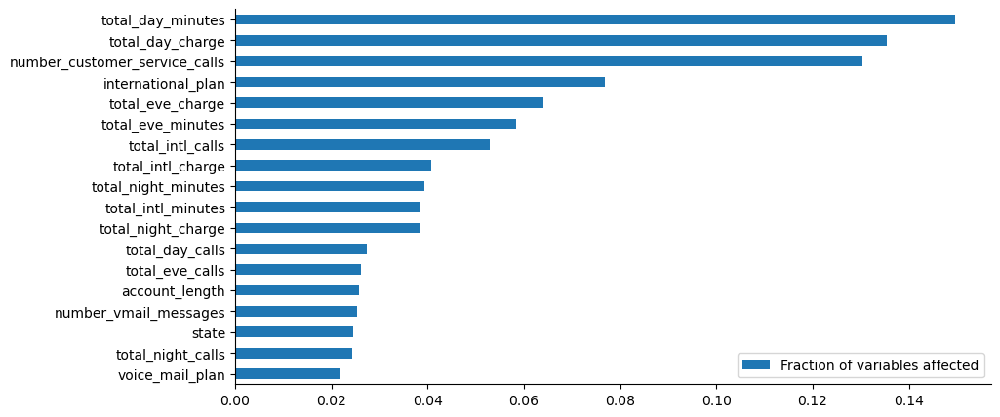

In [130]:
feat_scores = feat_scores.sort_values(by = 'Fraction of variables affected')
feat_scores.plot(kind = 'barh', figsize = (10,5))
sns.despine()

### Training and Evaluating a Logistic Regression Classifier - Part 1

In [131]:
# Import the class => Instantiate an object => Apply the fit method
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)

/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [132]:
y_predict = lr_model.predict(X_test)
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.87      0.98      0.92      1293
           1       0.40      0.10      0.16       207

    accuracy                           0.86      1500
   macro avg       0.64      0.54      0.54      1500
weighted avg       0.81      0.86      0.82      1500



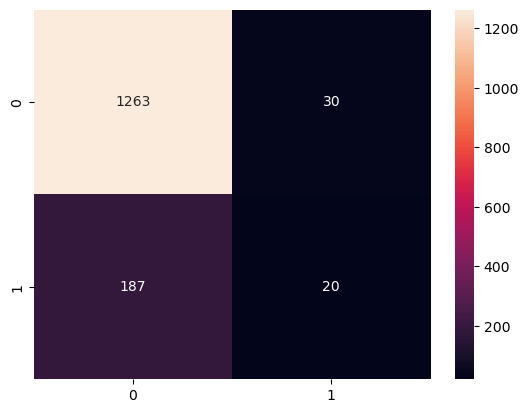

In [133]:
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot = True, fmt = 'd');
# The model accurately predicted 1300 samples with a true class of zero and 20 samples with a true class of one.
# However, it misclassified 190 samples as one when the true class was zero and
# 30 samples as zero when the true class was one.

### Training and Evaluating a Support Vector Machine Classifier - Part 1

In [134]:
svm_model = LinearSVC(max_iter = 100000)
svm_model = CalibratedClassifierCV(svm_model)
svm_model.fit(X_train, y_train)

/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarn

CalibratedClassifierCV(estimator=LinearSVC(max_iter=100000))

In [135]:
y_predict = svm_model.predict(X_test)
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.89      0.97      0.93      1293
           1       0.55      0.21      0.31       207

    accuracy                           0.87      1500
   macro avg       0.72      0.59      0.62      1500
weighted avg       0.84      0.87      0.84      1500



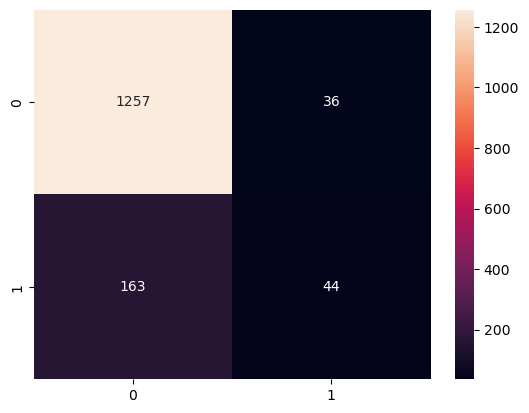

In [136]:
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot = True, fmt = 'd');

### Training and Evaluating a Random Forest Classifier - Part 1

In [137]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

RandomForestClassifier()

In [138]:
y_predict = rf_model.predict(X_test)
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.96      0.99      0.98      1293
           1       0.92      0.76      0.84       207

    accuracy                           0.96      1500
   macro avg       0.94      0.88      0.91      1500
weighted avg       0.96      0.96      0.96      1500



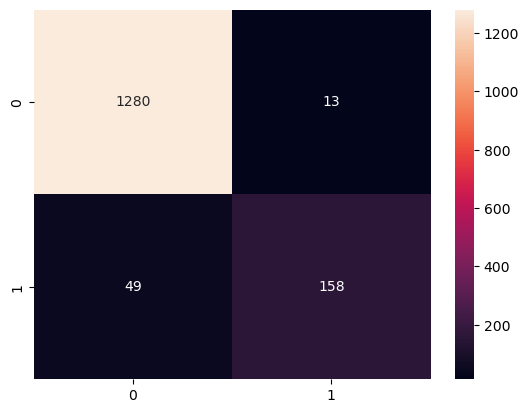

In [139]:
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot = True, fmt = 'd');

### Training and Evaluating a K-Nearest Neighbors Classifier - Part 1

In [140]:
# knn_model = KNeighborsClassifier()
# knn_model.fit(X_train, y_train)

In [141]:
# y_predict = knn_model.predict(X_test)
# print(classification_report(y_test, y_predict))

In [142]:
# cm = confusion_matrix(y_test, y_predict)
# sns.heatmap(cm, annot = True, fmt = 'd');

### Training and Evaluating a Naive Bayes Classifier - Part 1

In [143]:
gnb_model = GaussianNB()
gnb_model.fit(X_train, y_train)

GaussianNB()

In [144]:
y_predict = gnb_model.predict(X_test)
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.93      0.91      0.92      1293
           1       0.51      0.58      0.54       207

    accuracy                           0.86      1500
   macro avg       0.72      0.74      0.73      1500
weighted avg       0.87      0.86      0.87      1500



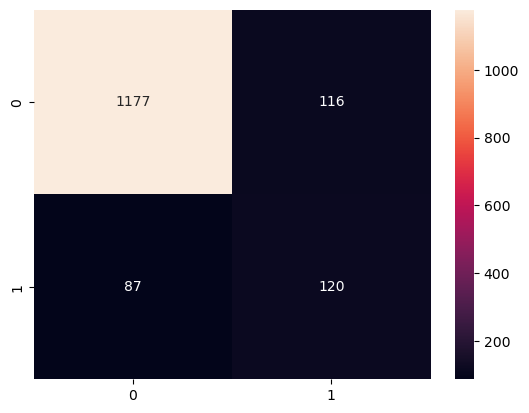

In [145]:
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot = True, fmt = 'd');

### Evaluating Performance Across Trained Classifier Models - Part 1

In [146]:
lr_model.predict_proba(X_test)
# Returns an array or matrix where each row corresponds to a sample, and each column corresponds to a class.
# The values in the matrix represent the estimated probability of the corresponding class for each sample.
# If you have a binary classification model, the output might look like [[0.3, 0.7]],
# where the first value (0.3) is the estimated probability for the first class (0) and
# the second value (0.7) is the estimated probability for the second class (1).

array([[0.88554744, 0.11445256],
       [0.86443669, 0.13556331],
       [0.99108604, 0.00891396],
       ...,
       [0.85490342, 0.14509658],
       [0.14829976, 0.85170024],
       [0.51719318, 0.48280682]])

In [147]:
lr_model.predict_proba(X_test)[:, 1]

array([0.11445256, 0.13556331, 0.00891396, ..., 0.14509658, 0.85170024,
       0.48280682])

In [148]:
fpr_lr, tpr_lr, thresh_lr = roc_curve(y_test, lr_model.predict_proba(X_test)[:, 1], pos_label = 1)
fpr_svm, tpr_svm, thresh_svm = roc_curve(y_test, svm_model.predict_proba(X_test)[:, 1], pos_label = 1)
fpr_rf, tpr_rf, thresh_rf = roc_curve(y_test, rf_model.predict_proba(X_test)[:, 1], pos_label = 1)
# fpr_knn, tpr_knn, thresh_knn = roc_curve(y_test, knn_model.predict_proba(X_test)[:, 1], pos_label = 1)
fpr_gnb, tpr_gnb, thresh_gnb = roc_curve(y_test, gnb_model.predict_proba(X_test)[:, 1], pos_label = 1)

In [149]:
auc_score_lr = roc_auc_score(y_test, lr_model.predict_proba(X_test)[:, 1])
auc_score_svm = roc_auc_score(y_test, svm_model.predict_proba(X_test)[:, 1])
auc_score_rf = roc_auc_score(y_test, rf_model.predict_proba(X_test)[:, 1])
# auc_score_knn = roc_auc_score(y_test, knn_model.predict_proba(X_test)[:, 1])
auc_score_gnb = roc_auc_score(y_test, gnb_model.predict_proba(X_test)[:, 1])

print('Logistic Regression: ', auc_score_lr)
print('Support Vector Machine: ', auc_score_svm)
print('Random Forest: ', auc_score_rf)
# print('K-Nearest Neighbors: ', auc_score_knn)
print('Naive Bayes: ', auc_score_gnb)

Logistic Regression:  0.7546058112990424
Support Vector Machine:  0.8169108279064902
Random Forest:  0.9261071320488248
Naive Bayes:  0.8523599762377125


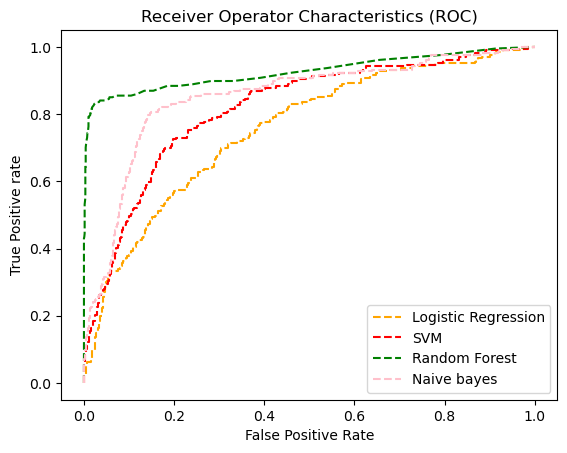

In [150]:
plt.plot(fpr_lr, tpr_lr, linestyle = '--', color = 'orange', label = 'Logistic Regression')
plt.plot(fpr_svm, tpr_svm, linestyle = '--', color = 'red', label = 'SVM')
plt.plot(fpr_rf, tpr_rf, linestyle = '--', color = 'green', label = 'Random Forest')
# plt.plot(fpr_knn, tpr_knn, linestyle = '--', color = 'yellow', label = 'KNN')
plt.plot(fpr_gnb, tpr_gnb, linestyle = '--', color = 'pink', label = 'Naive bayes')
plt.title('Receiver Operator Characteristics (ROC)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc = 'best');

### Conducting Exploratory Data Analysis - Part 2

In [151]:
credit_card_df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [152]:
credit_card_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [153]:
credit_card_df.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


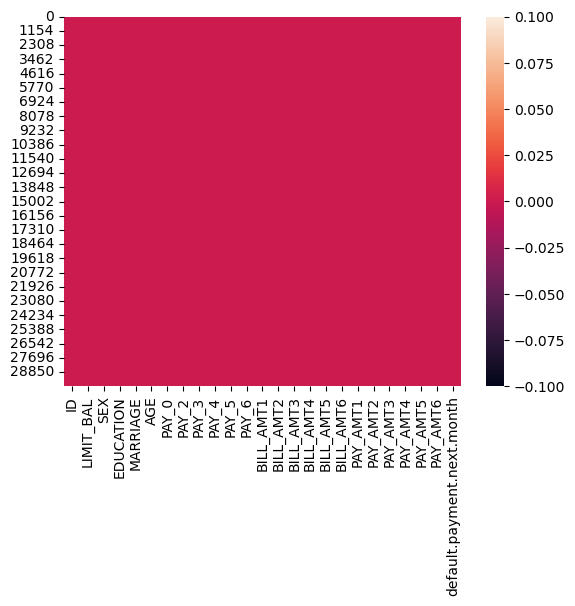

In [154]:
sns.heatmap(credit_card_df.isnull()); # there are no missing values

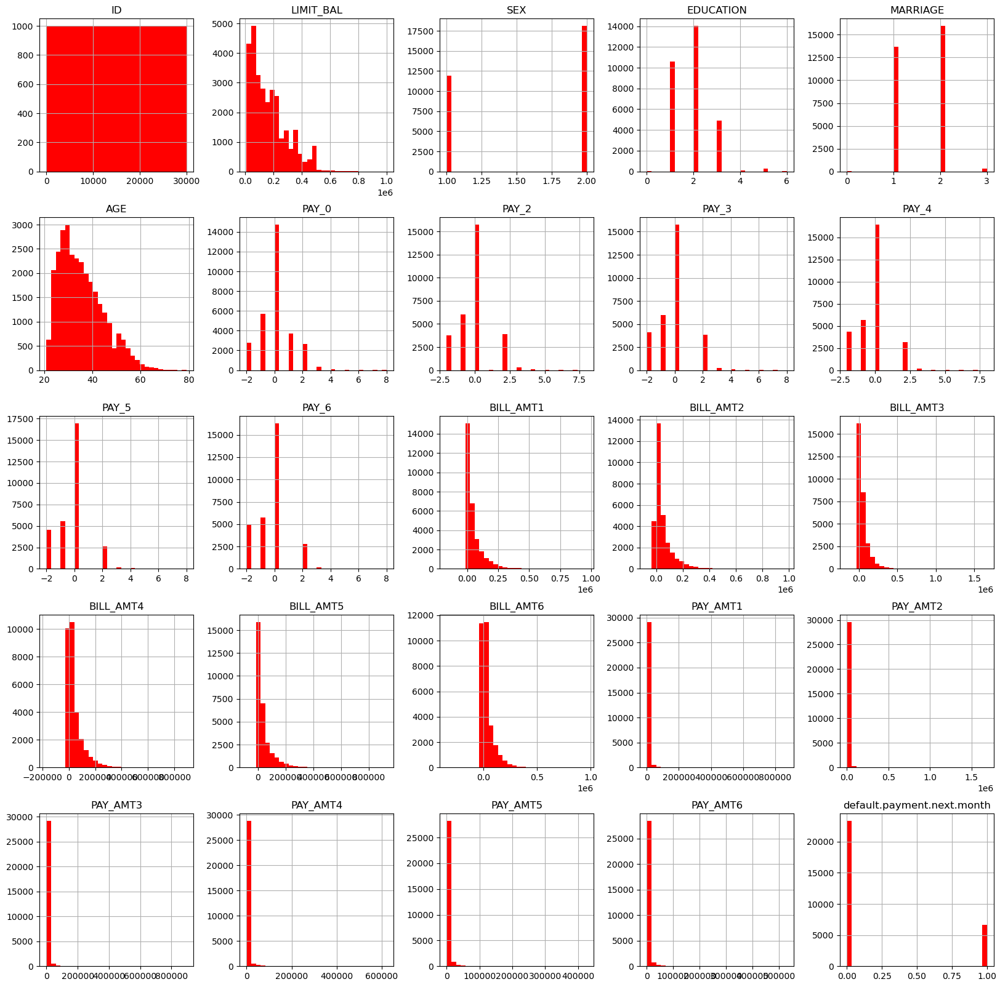

In [155]:
credit_card_df.hist(bins = 30, figsize = (20,20), color = 'r');

In [156]:
credit_card_df.drop(['ID'], axis = 1, inplace = True)

In [157]:
credit_card_df.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,120000.0,2,2,2,26,-1,2,0,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,90000.0,2,2,2,34,0,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,50000.0,2,2,1,37,0,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [158]:
cc_default_df = credit_card_df[credit_card_df['default.payment.next.month'] == 1]
cc_default_df

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,120000.0,2,2,2,26,-1,2,0,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
13,70000.0,1,2,2,30,1,2,2,0,0,...,66782.0,36137.0,36894.0,3200.0,0.0,3000.0,3000.0,1500.0,0.0,1
16,20000.0,1,1,2,24,0,0,2,2,2,...,18338.0,17905.0,19104.0,3200.0,0.0,1500.0,0.0,1650.0,0.0,1
21,120000.0,2,2,1,39,-1,-1,-1,-1,-1,...,0.0,632.0,316.0,316.0,316.0,0.0,632.0,316.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29991,210000.0,1,2,1,34,3,2,2,2,2,...,2500.0,2500.0,2500.0,0.0,0.0,0.0,0.0,0.0,0.0,1
29994,80000.0,1,2,2,34,2,2,2,2,2,...,77519.0,82607.0,81158.0,7000.0,3500.0,0.0,7000.0,0.0,4000.0,1
29997,30000.0,1,2,2,37,4,3,2,-1,0,...,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1
29998,80000.0,1,3,1,41,1,-1,0,0,0,...,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0,1


In [159]:
cc_no_default_df = credit_card_df[credit_card_df['default.payment.next.month'] == 0]
cc_no_default_df

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
2,90000.0,2,2,2,34,0,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,50000.0,2,2,1,37,0,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
5,50000.0,1,1,2,37,0,0,0,0,0,...,19394.0,19619.0,20024.0,2500.0,1815.0,657.0,1000.0,1000.0,800.0,0
6,500000.0,1,1,2,29,0,0,0,0,0,...,542653.0,483003.0,473944.0,55000.0,40000.0,38000.0,20239.0,13750.0,13770.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29990,140000.0,1,2,1,41,0,0,0,0,0,...,138262.0,49675.0,46121.0,6000.0,7000.0,4228.0,1505.0,2000.0,2000.0,0
29992,10000.0,1,3,1,43,0,0,0,-2,-2,...,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,0.0,0.0,0
29993,100000.0,1,1,2,38,0,-1,-1,0,0,...,70626.0,69473.0,55004.0,2000.0,111784.0,4000.0,3000.0,2000.0,2000.0,0
29995,220000.0,1,3,1,39,0,0,0,0,0,...,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0,0


In [160]:
print('Total number of customers:', len(credit_card_df))
print('Number of defaulted credit card customers:', len(cc_default_df))
print('Percentage of defaulted credit card customers:', len(cc_default_df)/len(credit_card_df)*100, '%') 
print('Number of non-defaulting credit card customers:', len(cc_no_default_df))
print('Percentage of non-defaulting credit card customers:', format(len(cc_no_default_df)/len(credit_card_df)*100, '.2f'), '%')

Total number of customers: 30000
Number of defaulted credit card customers: 6636
Percentage of defaulted credit card customers: 22.12 %
Number of non-defaulting credit card customers: 23364
Percentage of non-defaulting credit card customers: 77.88 %


In [161]:
cc_default_df.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,...,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.0
mean,130109.656420,1.567058,1.894665,1.528029,35.725738,0.668174,0.458258,0.362116,0.254521,0.167872,...,42036.950573,39540.190476,38271.435503,3397.044153,3388.649638,3367.351567,3155.626733,3219.139542,3441.482068,1.0
std,115378.540571,0.495520,0.728096,0.525433,9.693438,1.383252,1.502243,1.499401,1.508535,1.482833,...,64351.076092,61424.695949,59579.674268,9544.252427,11737.986064,12959.624486,11191.973162,11944.731175,13464.005894,0.0
min,10000.000000,1.000000,1.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-65167.000000,-53007.000000,-339603.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,50000.000000,1.000000,1.000000,1.000000,28.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,...,2141.500000,1502.750000,1150.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
50%,90000.000000,2.000000,2.000000,2.000000,34.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,19119.500000,18478.500000,18028.500000,1636.000000,1533.500000,1222.000000,1000.000000,1000.000000,1000.000000,1.0
75%,200000.000000,2.000000,2.000000,2.000000,42.000000,2.000000,2.000000,2.000000,2.000000,0.000000,...,50175.750000,47853.000000,47424.000000,3478.250000,3309.750000,3000.000000,2939.250000,3000.000000,2974.500000,1.0
max,740000.000000,2.000000,6.000000,3.000000,75.000000,8.000000,7.000000,8.000000,8.000000,8.000000,...,548020.000000,547880.000000,514975.000000,300000.000000,358689.000000,508229.000000,432130.000000,332000.000000,345293.000000,1.0


In [162]:
cc_no_default_df.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,23364.000000,23364.000000,23364.000000,23364.000000,23364.000000,23364.000000,23364.000000,23364.000000,23364.000000,23364.000000,...,23364.000000,23364.000000,23364.000000,23364.000000,2.336400e+04,23364.000000,23364.000000,23364.000000,23364.000000,23364.0
mean,178099.726074,1.614150,1.841337,1.558637,35.417266,-0.211222,-0.301917,-0.316256,-0.355633,-0.389488,...,43611.165254,40530.445343,39042.268704,6307.337357,6.640465e+03,5753.496833,5300.529319,5248.220296,5719.371769,0.0
std,131628.359660,0.486806,0.806780,0.520794,9.077355,0.952464,1.035191,1.048378,1.013162,0.977591,...,64324.796730,60617.268112,59547.015717,18014.508990,2.530226e+04,18684.255937,16689.778060,16071.667860,18792.950473,0.0
min,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-209051.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.0
25%,70000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2360.000000,1823.000000,1265.500000,1163.750000,1.005000e+03,600.000000,390.000000,369.000000,300.000000,0.0
50%,150000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,19000.000000,17998.000000,16679.000000,2459.500000,2.247500e+03,2000.000000,1734.000000,1765.000000,1706.000000,0.0
75%,250000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,55988.000000,51135.250000,49842.500000,5606.250000,5.311250e+03,5000.000000,4602.000000,4600.000000,4545.000000,0.0
max,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,7.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.000000,621000.000000,426529.000000,528666.000000,0.0


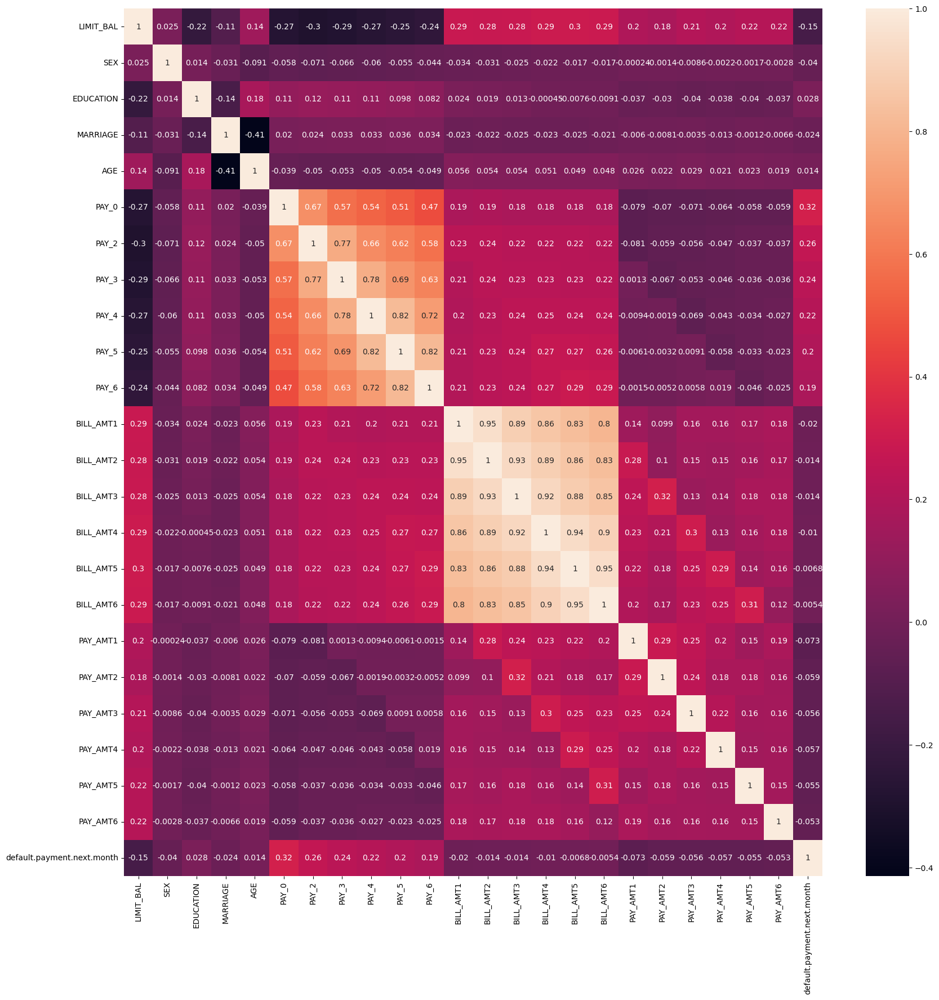

In [163]:
f, ax = plt.subplots(figsize = (20,20))
sns.heatmap(credit_card_df.corr(), annot = True);

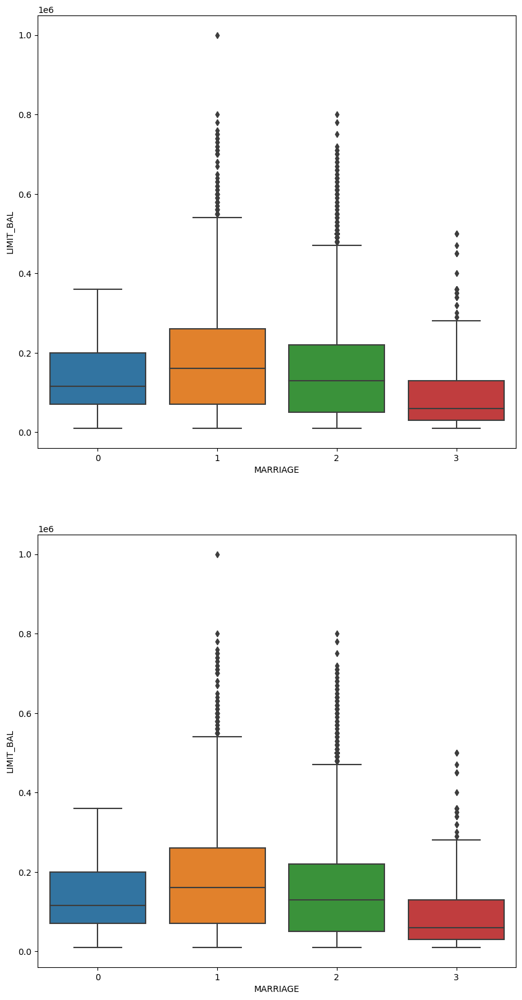

In [164]:
plt.figure(figsize = (10,20))
plt.subplot(211) # to create a subplot grid with 2 rows and 1 column and activate the first subplot
sns.boxplot(x = 'MARRIAGE', y = 'LIMIT_BAL', data = credit_card_df);
plt.subplot(212)
sns.boxplot(x = 'MARRIAGE', y = 'LIMIT_BAL', data = credit_card_df);

### Data Preprocessing for Model Training - Part 2

In [165]:
X_cat = credit_card_df[['SEX', 'EDUCATION', 'MARRIAGE']]
X_cat.head()

,SEX,EDUCATION,MARRIAGE
0,2,2,1
1,2,2,2
2,2,2,2
3,2,2,1
4,1,2,1


In [166]:
one_hot_encoder = OneHotEncoder()
X_cat_encoded = one_hot_encoder.fit_transform(X_cat).toarray()
X_cat_encoded

array([[0., 1., 0., ..., 1., 0., 0.],
       [0., 1., 0., ..., 0., 1., 0.],
       [0., 1., 0., ..., 0., 1., 0.],
       ...,
       [1., 0., 0., ..., 0., 1., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.]])

In [167]:
X_cat_encoded_df = pd.DataFrame(X_cat_encoded)
X_cat_encoded_df.columns = X_cat_encoded_df.columns.astype(str)
X_cat_encoded_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [168]:
X_num = credit_card_df[['LIMIT_BAL', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 
                        'BILL_AMT1','BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6',
                        'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']]
X_num.head()

,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,24,2,2,-1,-1,-2,-2,3913.0,3102.0,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,26,-1,2,0,0,0,2,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,34,0,0,0,0,0,0,29239.0,14027.0,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,37,0,0,0,0,0,0,46990.0,48233.0,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,57,-1,0,-1,0,0,0,8617.0,5670.0,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [169]:
min_max_scaler = MinMaxScaler()
X_num_scaled = min_max_scaler.fit_transform(X_num)
X_num_scaled

array([[0.01010101, 0.05172414, 0.4       , ..., 0.        , 0.        ,
        0.        ],
       [0.11111111, 0.0862069 , 0.1       , ..., 0.00161031, 0.        ,
        0.00378311],
       [0.08080808, 0.22413793, 0.2       , ..., 0.00161031, 0.00234451,
        0.00945777],
       ...,
       [0.02020202, 0.27586207, 0.6       , ..., 0.00676329, 0.00468901,
        0.00586382],
       [0.07070707, 0.34482759, 0.3       , ..., 0.00310145, 0.12417444,
        0.00341236],
       [0.04040404, 0.43103448, 0.2       , ..., 0.00161031, 0.00234451,
        0.00189155]])

In [170]:
X_num_scaled_df = pd.DataFrame(X_num_scaled)
X_num_scaled_df.columns = ['LIMIT_BAL', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6',
                           'BILL_AMT1','BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6',
                           'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']
X_num_scaled_df.head()

,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,0.010101,0.051724,0.4,0.4,0.1,0.1,0.0,0.0,0.149982,0.069164,0.086723,0.160138,0.080648,0.260979,0.000000,0.000409,0.000000,0.000000,0.000000,0.000000
1,0.111111,0.086207,0.1,0.4,0.2,0.2,0.2,0.4,0.148892,0.067858,0.087817,0.163220,0.084074,0.263485,0.000000,0.000594,0.001116,0.001610,0.000000,0.003783
2,0.080808,0.224138,0.2,0.2,0.2,0.2,0.2,0.2,0.172392,0.079532,0.093789,0.173637,0.095470,0.272928,0.001738,0.000891,0.001116,0.001610,0.002345,0.009458
3,0.040404,0.275862,0.2,0.2,0.2,0.2,0.2,0.2,0.188100,0.111995,0.113407,0.186809,0.109363,0.283685,0.002290,0.001199,0.001339,0.001771,0.002506,0.001892
4,0.040404,0.620690,0.1,0.2,0.1,0.2,0.2,0.2,0.154144,0.071601,0.106020,0.179863,0.099633,0.275681,0.002290,0.021779,0.011160,0.014493,0.001615,0.001284


In [171]:
X = pd.concat([X_cat_encoded_df, X_num_scaled_df], axis = 1)
X.head()

,0,1,2,3,4,5,6,7,8,9,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.086723,0.160138,0.080648,0.260979,0.000000,0.000409,0.000000,0.000000,0.000000,0.000000
1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.087817,0.163220,0.084074,0.263485,0.000000,0.000594,0.001116,0.001610,0.000000,0.003783
2,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.093789,0.173637,0.095470,0.272928,0.001738,0.000891,0.001116,0.001610,0.002345,0.009458
3,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.113407,0.186809,0.109363,0.283685,0.002290,0.001199,0.001339,0.001771,0.002506,0.001892
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.106020,0.179863,0.099633,0.275681,0.002290,0.021779,0.011160,0.014493,0.001615,0.001284


In [172]:
y = credit_card_df['default.payment.next.month']
y.head()

0    1
1    1
2    0
3    0
4    0
Name: default.payment.next.month, dtype: int64

In [173]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
X_train.shape

(24000, 33)

In [174]:
X_test.shape

(6000, 33)

### Training and Evaluating an XGBoost Classifier - Part 2

In [175]:
xgb_model = xgb.XGBClassifier(learning_rate = 0.1, max_depth = 20, use_label_encoder = False)
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=20, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [176]:
y_predict = xgb_model.predict(X_test)
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.84      0.94      0.88      4672
           1       0.62      0.36      0.45      1328

    accuracy                           0.81      6000
   macro avg       0.73      0.65      0.67      6000
weighted avg       0.79      0.81      0.79      6000



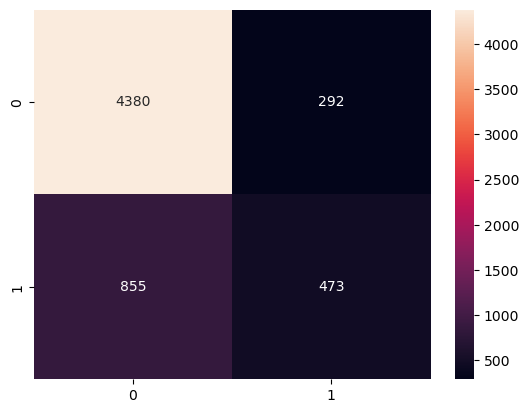

In [177]:
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot = True, fmt = 'd');

### Training and Evaluating a Logistic Regression Classifier - Part 2

In [178]:
lr_model = LogisticRegression(max_iter = 10000)
lr_model.fit(X_train, y_train)

LogisticRegression(max_iter=10000)

In [179]:
y_predict = lr_model.predict(X_test)
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.82      0.97      0.89      4672
           1       0.70      0.23      0.35      1328

    accuracy                           0.81      6000
   macro avg       0.76      0.60      0.62      6000
weighted avg       0.79      0.81      0.77      6000



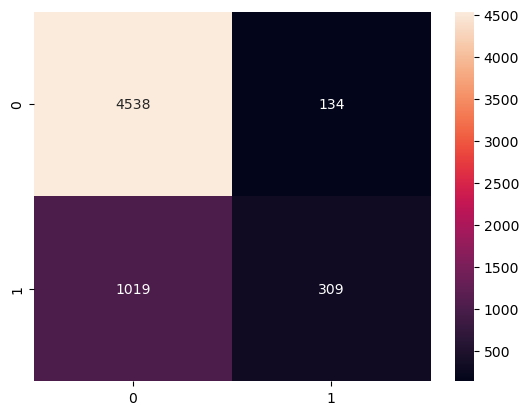

In [180]:
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot = True, fmt = 'd');

### Training and Evaluating a Support Vector Machine Classifier - Part 2

In [181]:
svm_model = LinearSVC(max_iter = 100000)
svm_model = CalibratedClassifierCV(svm_model)
svm_model.fit(X_train, y_train)

/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the wa

CalibratedClassifierCV(estimator=LinearSVC(max_iter=100000))

In [182]:
y_predict = svm_model.predict(X_test)
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.82      0.97      0.89      4672
           1       0.69      0.24      0.35      1328

    accuracy                           0.81      6000
   macro avg       0.75      0.60      0.62      6000
weighted avg       0.79      0.81      0.77      6000



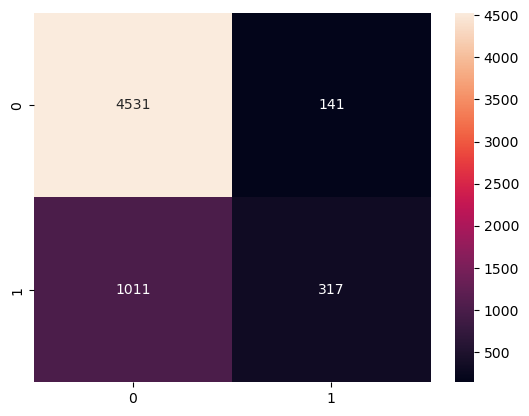

In [183]:
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot = True, fmt = 'd');

### Training and Evaluating a K-Nearest Neighbors Classifier - Part 1

In [184]:
# knn_model = KNeighborsClassifier()
# knn_model.fit(X_train, y_train)

In [185]:
# y_predict = knn_model.predict(X_test)
# print(classification_report(y_test, y_predict))

In [186]:
# cm = confusion_matrix(y_test, y_predict)
# sns.heatmap(cm, annot = True, fmt = 'd');

### Training and Evaluating a Random Forest Classifier - Part 2

In [187]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

RandomForestClassifier()

In [188]:
y_predict = rf_model.predict(X_test)
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.84      0.94      0.89      4672
           1       0.64      0.38      0.47      1328

    accuracy                           0.81      6000
   macro avg       0.74      0.66      0.68      6000
weighted avg       0.80      0.81      0.80      6000



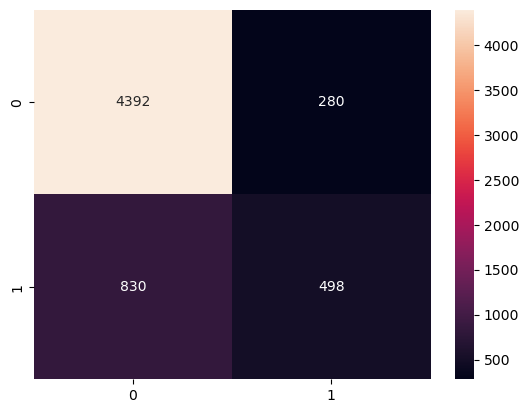

In [189]:
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot = True, fmt = 'd');

### Training and Evaluating a K-Nearest Neighbors Classifier - Part 2

In [190]:
# knn_model = KNeighborsClassifier()
# knn_model.fit(X_train, y_train)

In [191]:
# y_predict = knn_model.predict(X_test)
# print(classification_report(y_test, y_predict))

In [192]:
# cm = confusion_matrix(y_test, y_predict)
# sns.heatmap(cm, annot = True, fmt = 'd');

### Training and Evaluating a Naive Bayes Classifier - Part 2

In [193]:
gnb_model = GaussianNB()
gnb_model.fit(X_train, y_train)

GaussianNB()

In [194]:
y_predict = gnb_model.predict(X_test)
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.92      0.09      0.17      4672
           1       0.23      0.97      0.38      1328

    accuracy                           0.29      6000
   macro avg       0.58      0.53      0.27      6000
weighted avg       0.77      0.29      0.22      6000



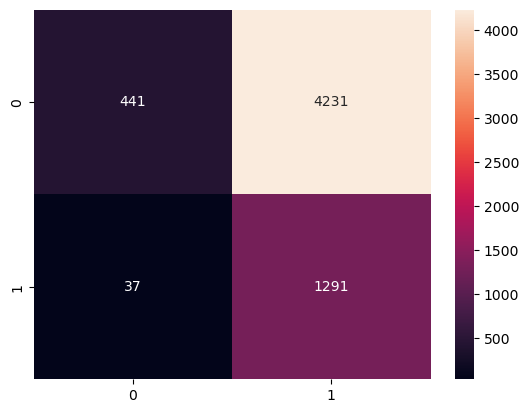

In [195]:
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot = True, fmt = 'd');

### Evaluating Performance Across Trained Classifier Models - Part 2

In [196]:
fpr_xgb, tpr_xgb, thresh_xgb = roc_curve(y_test, xgb_model.predict_proba(X_test)[:, 1], pos_label = 1)
fpr_lr, tpr_lr, thresh_lr = roc_curve(y_test, lr_model.predict_proba(X_test)[:, 1], pos_label = 1)
fpr_svm, tpr_svm, thresh_svm = roc_curve(y_test, svm_model.predict_proba(X_test)[:, 1], pos_label = 1)
fpr_rf, tpr_rf, thresh_rf = roc_curve(y_test, rf_model.predict_proba(X_test)[:, 1], pos_label = 1)
# fpr_knn, tpr_knn, thresh_knn = roc_curve(y_test, knn_model.predict_proba(X_test)[:, 1], pos_label = 1)
fpr_gnb, tpr_gnb, thresh_gnb = roc_curve(y_test, gnb_model.predict_proba(X_test)[:, 1], pos_label = 1)

In [197]:
auc_score_xgb = roc_auc_score(y_test, xgb_model.predict_proba(X_test)[:, 1])
auc_score_lr = roc_auc_score(y_test, lr_model.predict_proba(X_test)[:, 1])
auc_score_svm = roc_auc_score(y_test, svm_model.predict_proba(X_test)[:, 1])
auc_score_rf = roc_auc_score(y_test, rf_model.predict_proba(X_test)[:, 1])
# auc_score_knn = roc_auc_score(y_test, knn_model.predict_proba(X_test)[:, 1])
auc_score_gnb = roc_auc_score(y_test, gnb_model.predict_proba(X_test)[:, 1])

print('XGBoost: ', auc_score_xgb)
print('Logistic Regression: ', auc_score_lr)
print('Support Vector Machine: ', auc_score_svm)
print('Random Forest: ', auc_score_rf)
# print('K-Nearest Neighbors: ', auc_score_knn)
print('Naive Bayes: ', auc_score_gnb)

XGBoost:  0.7620430351543159
Logistic Regression:  0.7154816827240469
Support Vector Machine:  0.7148832380033834
Random Forest:  0.7523837860001649
Naive Bayes:  0.7259143326301782


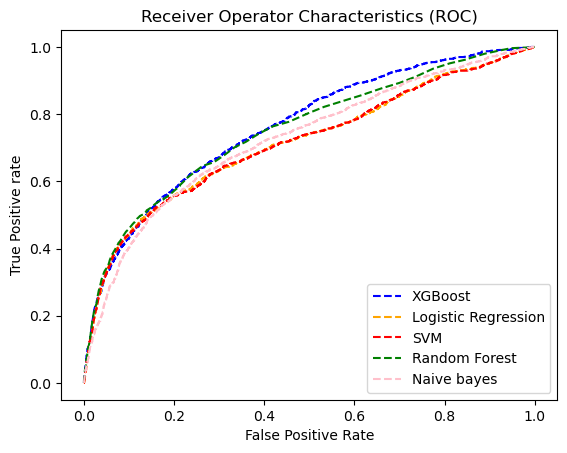

In [198]:
plt.plot(fpr_xgb, tpr_xgb, linestyle = '--', color = 'blue', label = 'XGBoost')
plt.plot(fpr_lr, tpr_lr, linestyle = '--', color = 'orange', label = 'Logistic Regression')
plt.plot(fpr_svm, tpr_svm, linestyle = '--', color = 'red', label = 'SVM')
plt.plot(fpr_rf, tpr_rf, linestyle = '--', color = 'green', label = 'Random Forest')
# plt.plot(fpr_knn, tpr_knn, linestyle = '--', color = 'yellow', label = 'KNN')
plt.plot(fpr_gnb, tpr_gnb, linestyle = '--', color = 'pink', label = 'Naive bayes')
plt.title('Receiver Operator Characteristics (ROC)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc = 'best');

## Models Optimization

In [199]:
bike_df.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,hum,windspeed,casual,registered,cnt
0,1,1/1/2011,1,0,1,0,6,0,2,0.344167,0.805833,0.160446,331,654,985
1,2,1/2/2011,1,0,1,0,0,0,2,0.363478,0.696087,0.248539,131,670,801
2,3,1/3/2011,1,0,1,0,1,1,1,0.196364,0.437273,0.248309,120,1229,1349
3,4,1/4/2011,1,0,1,0,2,1,1,0.200000,0.590435,0.160296,108,1454,1562
4,5,1/5/2011,1,0,1,0,3,1,1,0.226957,0.436957,0.186900,82,1518,1600


In [200]:
bike_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     731 non-null    int64  
 1   dteday      731 non-null    object 
 2   season      731 non-null    int64  
 3   yr          731 non-null    int64  
 4   mnth        731 non-null    int64  
 5   holiday     731 non-null    int64  
 6   weekday     731 non-null    int64  
 7   workingday  731 non-null    int64  
 8   weathersit  731 non-null    int64  
 9   temp        731 non-null    float64
 10  hum         731 non-null    float64
 11  windspeed   731 non-null    float64
 12  casual      731 non-null    int64  
 13  registered  731 non-null    int64  
 14  cnt         731 non-null    int64  
dtypes: float64(3), int64(11), object(1)
memory usage: 85.8+ KB


In [201]:
bike_df.describe()

,instant,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,hum,windspeed,casual,registered,cnt
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,366.000000,2.496580,0.500684,6.519836,0.028728,2.997264,0.683995,1.395349,0.495385,0.627894,0.190486,848.176471,3656.172367,4504.348837
std,211.165812,1.110807,0.500342,3.451913,0.167155,2.004787,0.465233,0.544894,0.183051,0.142429,0.077498,686.622488,1560.256377,1937.211452
min,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.059130,0.000000,0.022392,2.000000,20.000000,22.000000
25%,183.500000,2.000000,0.000000,4.000000,0.000000,1.000000,0.000000,1.000000,0.337083,0.520000,0.134950,315.500000,2497.000000,3152.000000
50%,366.000000,3.000000,1.000000,7.000000,0.000000,3.000000,1.000000,1.000000,0.498333,0.626667,0.180975,713.000000,3662.000000,4548.000000
75%,548.500000,3.000000,1.000000,10.000000,0.000000,5.000000,1.000000,2.000000,0.655417,0.730209,0.233214,1096.000000,4776.500000,5956.000000
max,731.000000,4.000000,1.000000,12.000000,1.000000,6.000000,1.000000,3.000000,0.861667,0.972500,0.507463,3410.000000,6946.000000,8714.000000


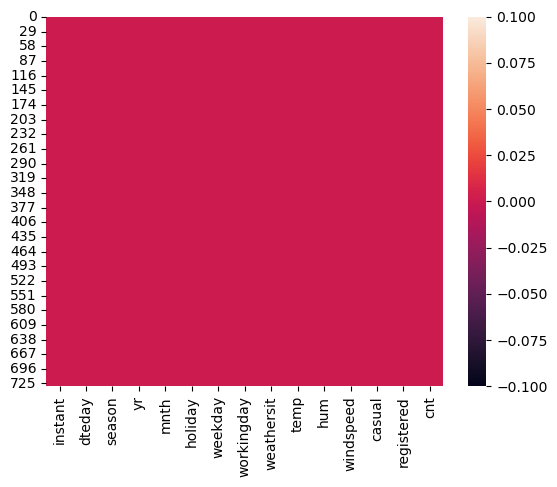

In [202]:
sns.heatmap(bike_df.isnull());

In [203]:
bike_df.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,hum,windspeed,casual,registered,cnt
0,1,1/1/2011,1,0,1,0,6,0,2,0.344167,0.805833,0.160446,331,654,985
1,2,1/2/2011,1,0,1,0,0,0,2,0.363478,0.696087,0.248539,131,670,801
2,3,1/3/2011,1,0,1,0,1,1,1,0.196364,0.437273,0.248309,120,1229,1349
3,4,1/4/2011,1,0,1,0,2,1,1,0.200000,0.590435,0.160296,108,1454,1562
4,5,1/5/2011,1,0,1,0,3,1,1,0.226957,0.436957,0.186900,82,1518,1600


In [204]:
bike_df = bike_df.drop(labels = ['instant'], axis = 1)
bike_df = bike_df.drop(labels = ['casual', 'registered'], axis = 1)
bike_df['dteday'] = pd.to_datetime(bike_df['dteday'], format = '%m/%d/%Y')
bike_df.index = pd.DatetimeIndex(bike_df['dteday'])
bike_df = bike_df.drop(labels = ['dteday'], axis = 1)
bike_df.head()

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,hum,windspeed,cnt
dteday,,,,,,,,,,,
2011-01-01,1,0,1,0,6,0,2,0.344167,0.805833,0.160446,985
2011-01-02,1,0,1,0,0,0,2,0.363478,0.696087,0.248539,801
2011-01-03,1,0,1,0,1,1,1,0.196364,0.437273,0.248309,1349
2011-01-04,1,0,1,0,2,1,1,0.200000,0.590435,0.160296,1562
2011-01-05,1,0,1,0,3,1,1,0.226957,0.436957,0.186900,1600


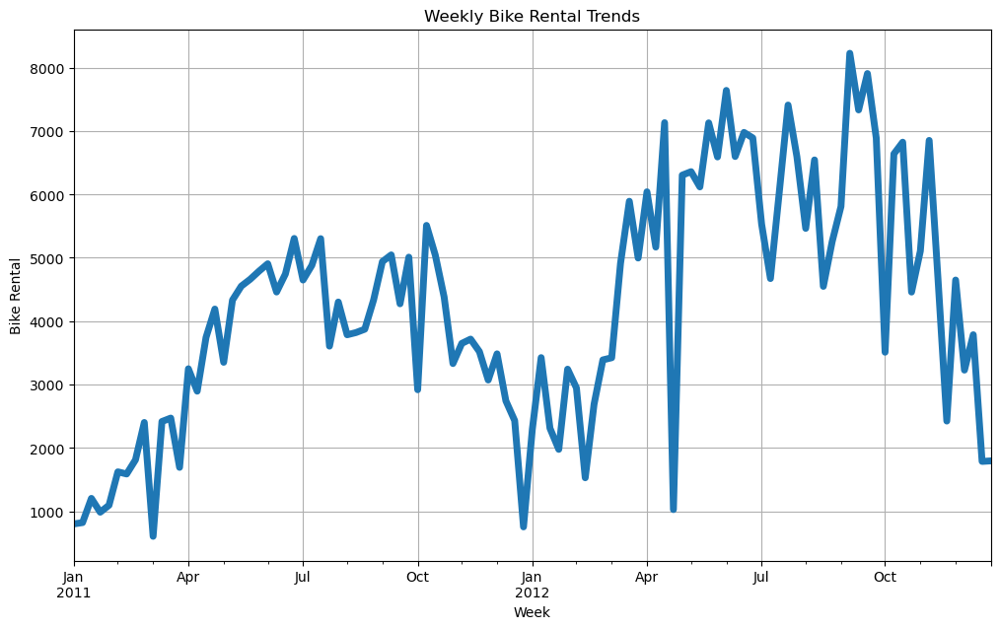

In [205]:
plt.figure(figsize = (12,7))
bike_df['cnt'].asfreq('W').plot(linewidth = 5)
plt.title('Weekly Bike Rental Trends')
plt.xlabel('Week')
plt.ylabel('Bike Rental')
plt.grid();

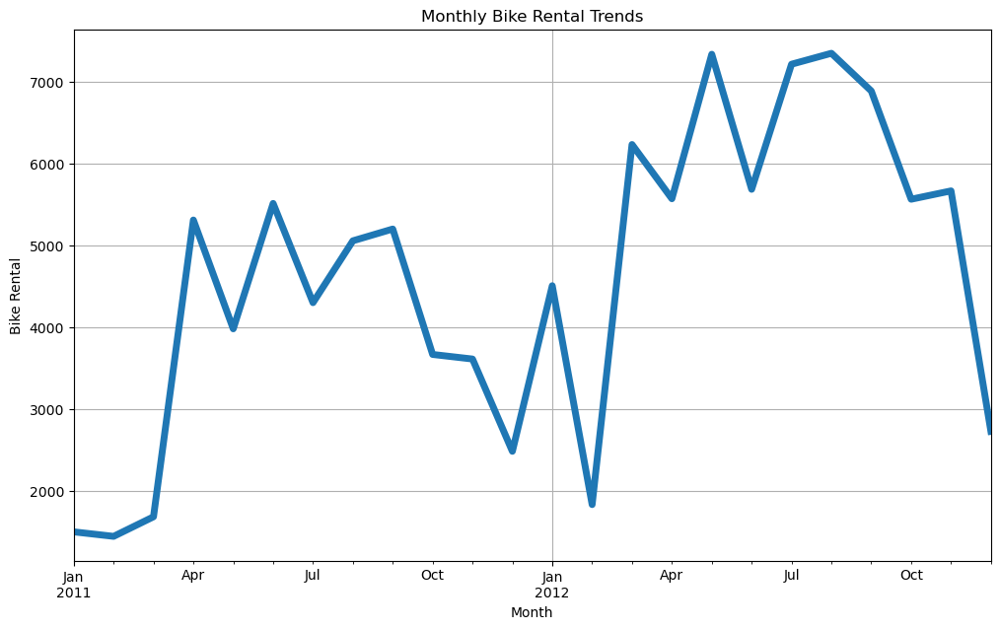

In [206]:
plt.figure(figsize = (12,7))
bike_df['cnt'].asfreq('M').plot(linewidth = 5)
plt.title('Monthly Bike Rental Trends')
plt.xlabel('Month')
plt.ylabel('Bike Rental')
plt.grid();

/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


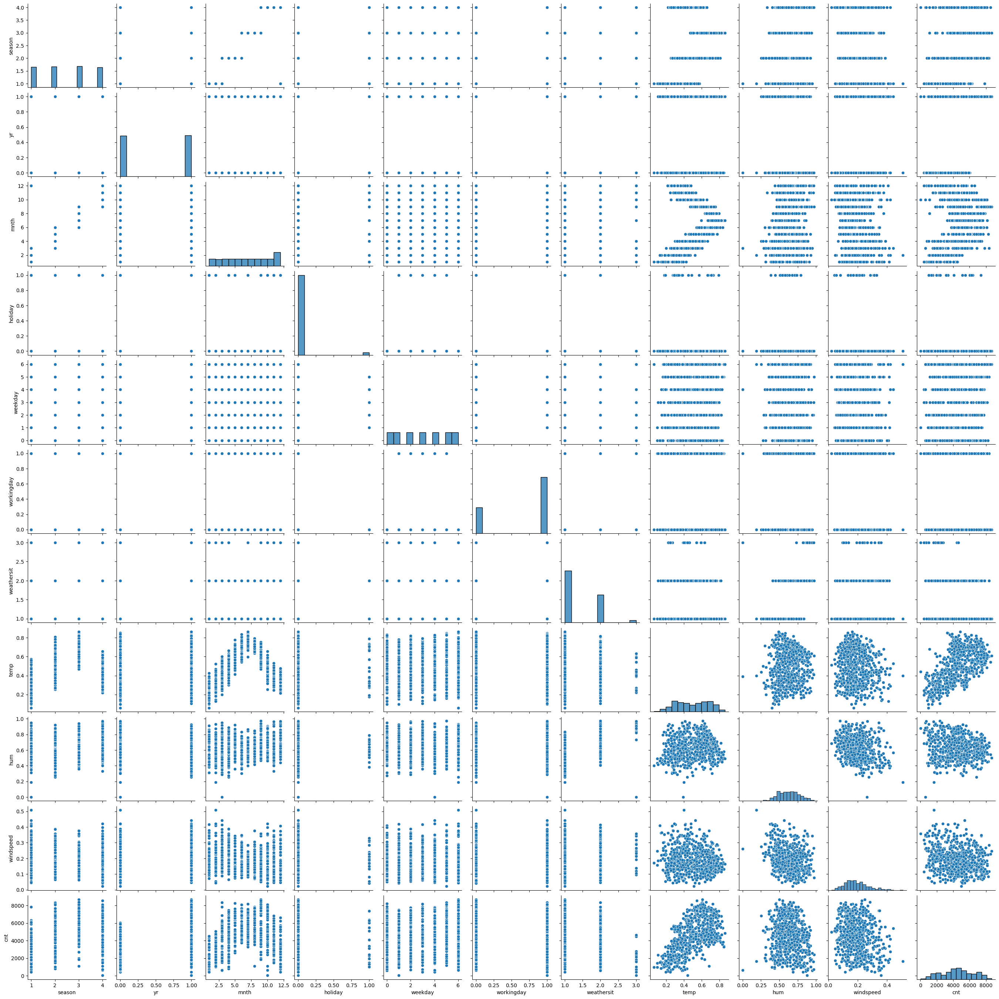

In [207]:
sns.pairplot(bike_df);

In [208]:
X_numerical = bike_df[['temp', 'hum', 'windspeed', 'cnt']]
X_numerical.head()

,temp,hum,windspeed,cnt
dteday,,,,
2011-01-01,0.344167,0.805833,0.160446,985
2011-01-02,0.363478,0.696087,0.248539,801
2011-01-03,0.196364,0.437273,0.248309,1349
2011-01-04,0.200000,0.590435,0.160296,1562
2011-01-05,0.226957,0.436957,0.186900,1600


/Users/alinakurliantseva/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


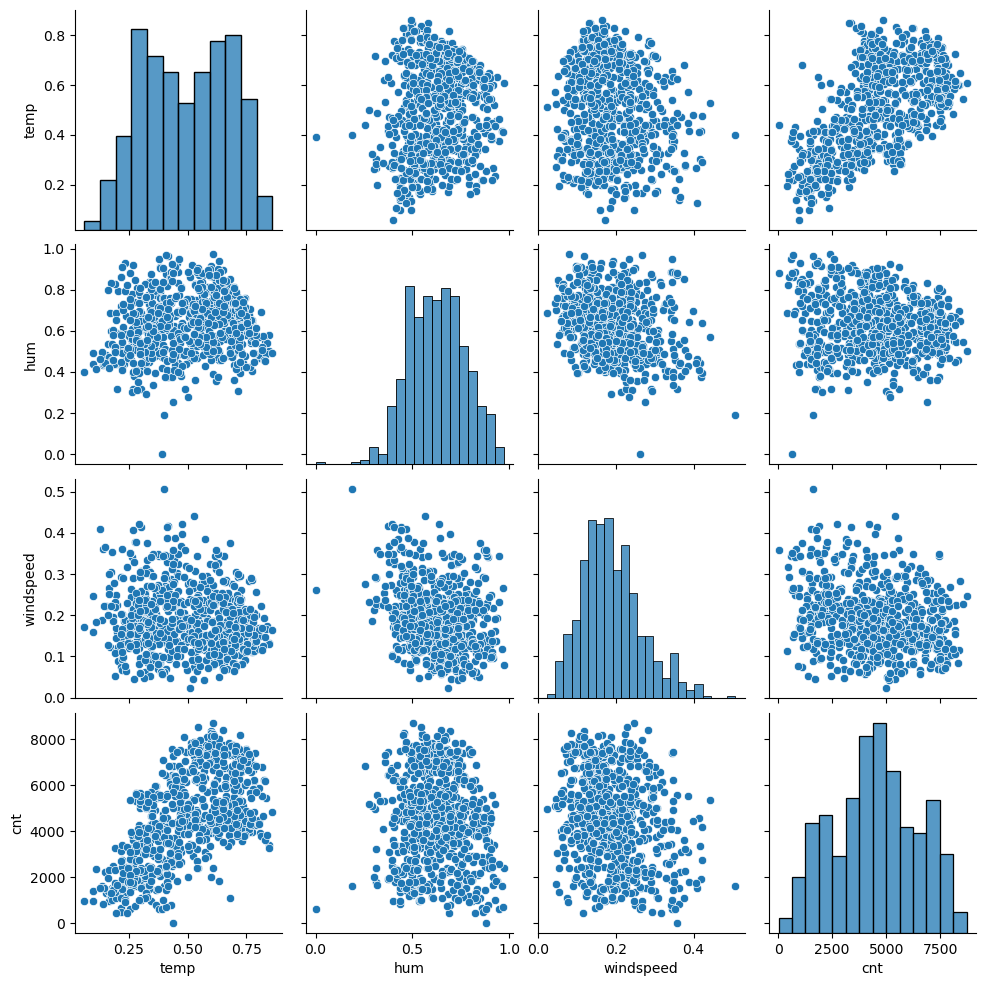

In [209]:
sns.pairplot(X_numerical);

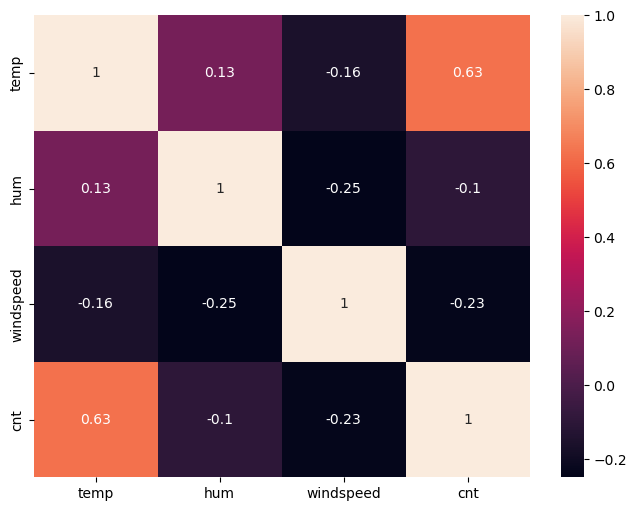

In [210]:
plt.figure(figsize = (8,6))
sns.heatmap(X_numerical.corr(), annot = True);

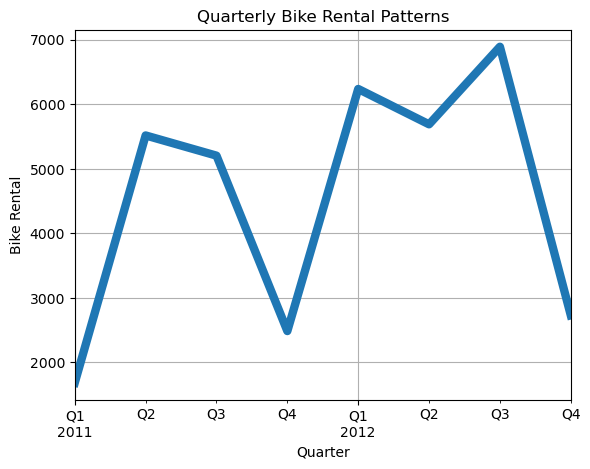

In [211]:
bike_df['cnt'].asfreq('Q').plot(linewidth = 6)
plt.title('Quarterly Bike Rental Patterns')
plt.xlabel('Quarter')
plt.ylabel('Bike Rental')
plt.grid();

In [212]:
X_cat = bike_df[['season', 'yr', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit']]
X_cat.head()

,season,yr,mnth,holiday,weekday,workingday,weathersit
dteday,,,,,,,
2011-01-01,1,0,1,0,6,0,2
2011-01-02,1,0,1,0,0,0,2
2011-01-03,1,0,1,0,1,1,1
2011-01-04,1,0,1,0,2,1,1
2011-01-05,1,0,1,0,3,1,1


In [213]:
one_hot_encoder = OneHotEncoder()
X_cat_encoded = one_hot_encoder.fit_transform(X_cat).toarray()
X_cat_encoded

array([[1., 0., 0., ..., 0., 1., 0.],
       [1., 0., 0., ..., 0., 1., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 1., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 0., 1., 0.]])

In [214]:
X_cat_encoded.shape

(731, 32)

In [215]:
X_cat_encoded = pd.DataFrame(X_cat_encoded)
X_cat_encoded.head()

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
1,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
3,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
4,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0


In [216]:
X_numerical

,temp,hum,windspeed,cnt
dteday,,,,
2011-01-01,0.344167,0.805833,0.160446,985
2011-01-02,0.363478,0.696087,0.248539,801
2011-01-03,0.196364,0.437273,0.248309,1349
2011-01-04,0.200000,0.590435,0.160296,1562
2011-01-05,0.226957,0.436957,0.186900,1600
...,...,...,...,...
2012-12-27,0.254167,0.652917,0.350133,2114
2012-12-28,0.253333,0.590000,0.155471,3095
2012-12-29,0.253333,0.752917,0.124383,1341


In [217]:
X_numerical = X_numerical.reset_index()
X_numerical

,dteday,temp,hum,windspeed,cnt
0,2011-01-01,0.344167,0.805833,0.160446,985
1,2011-01-02,0.363478,0.696087,0.248539,801
2,2011-01-03,0.196364,0.437273,0.248309,1349
3,2011-01-04,0.200000,0.590435,0.160296,1562
4,2011-01-05,0.226957,0.436957,0.186900,1600
...,...,...,...,...,...
726,2012-12-27,0.254167,0.652917,0.350133,2114
727,2012-12-28,0.253333,0.590000,0.155471,3095
728,2012-12-29,0.253333,0.752917,0.124383,1341
729,2012-12-30,0.255833,0.483333,0.350754,1796


In [218]:
X_all = pd.concat([X_cat_encoded, X_numerical], axis = 1)
X_all

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,dteday,temp,hum,windspeed,cnt
0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,2011-01-01,0.344167,0.805833,0.160446,985
1,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,2011-01-02,0.363478,0.696087,0.248539,801
2,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,2011-01-03,0.196364,0.437273,0.248309,1349
3,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,2011-01-04,0.200000,0.590435,0.160296,1562
4,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,2011-01-05,0.226957,0.436957,0.186900,1600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,2012-12-27,0.254167,0.652917,0.350133,2114
727,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,2012-12-28,0.253333,0.590000,0.155471,3095
728,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,2012-12-29,0.253333,0.752917,0.124383,1341
729,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,2012-12-30,0.255833,0.483333,0.350754,1796


In [219]:
X_all = X_all.drop('dteday', axis = 1)
X_all

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,temp,hum,windspeed,cnt
0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,1.0,0.0,0.344167,0.805833,0.160446,985
1,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.363478,0.696087,0.248539,801
2,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.196364,0.437273,0.248309,1349
3,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.200000,0.590435,0.160296,1562
4,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.226957,0.436957,0.186900,1600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.254167,0.652917,0.350133,2114
727,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.253333,0.590000,0.155471,3095
728,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,1.0,0.0,0.253333,0.752917,0.124383,1341
729,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.255833,0.483333,0.350754,1796


In [220]:
print(X_all.iloc[:, :-1].values)
X = X_all.iloc[:, :-1].values

[[1.       0.       0.       ... 0.344167 0.805833 0.160446]
 [1.       0.       0.       ... 0.363478 0.696087 0.248539]
 [1.       0.       0.       ... 0.196364 0.437273 0.248309]
 ...
 [1.       0.       0.       ... 0.253333 0.752917 0.124383]
 [1.       0.       0.       ... 0.255833 0.483333 0.350754]
 [1.       0.       0.       ... 0.215833 0.5775   0.154846]]


In [221]:
print(X_all.iloc[:, -1:].values)
y = X_all.iloc[:, -1:].values

[[ 985]
 [ 801]
 [1349]
 [1562]
 [1600]
 [1606]
 [1510]
 [ 959]
 [ 822]
 [1321]
 [1263]
 [1162]
 [1406]
 [1421]
 [1248]
 [1204]
 [1000]
 [ 683]
 [1650]
 [1927]
 [1543]
 [ 981]
 [ 986]
 [1416]
 [1985]
 [ 506]
 [ 431]
 [1167]
 [1098]
 [1096]
 [1501]
 [1360]
 [1526]
 [1550]
 [1708]
 [1005]
 [1623]
 [1712]
 [1530]
 [1605]
 [1538]
 [1746]
 [1472]
 [1589]
 [1913]
 [1815]
 [2115]
 [2475]
 [2927]
 [1635]
 [1812]
 [1107]
 [1450]
 [1917]
 [1807]
 [1461]
 [1969]
 [2402]
 [1446]
 [1851]
 [2134]
 [1685]
 [1944]
 [2077]
 [ 605]
 [1872]
 [2133]
 [1891]
 [ 623]
 [1977]
 [2132]
 [2417]
 [2046]
 [2056]
 [2192]
 [2744]
 [3239]
 [3117]
 [2471]
 [2077]
 [2703]
 [2121]
 [1865]
 [2210]
 [2496]
 [1693]
 [2028]
 [2425]
 [1536]
 [1685]
 [2227]
 [2252]
 [3249]
 [3115]
 [1795]
 [2808]
 [3141]
 [1471]
 [2455]
 [2895]
 [3348]
 [2034]
 [2162]
 [3267]
 [3126]
 [ 795]
 [3744]
 [3429]
 [3204]
 [3944]
 [4189]
 [1683]
 [4036]
 [4191]
 [4073]
 [4400]
 [3872]
 [4058]
 [4595]
 [5312]
 [3351]
 [4401]
 [4451]
 [2633]
 [4433]


In [222]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [223]:
X_train.shape

(584, 35)

In [224]:
X_test.shape

(147, 35)

In [225]:
model = xgb.XGBRegressor(objective = 'reg:squarederror', learning_rate = 1, max_depth = 20, n_estimators = 500)
model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=20, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=500, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [226]:
result = model.score(X_test, y_test)
print('Accuracy: {}'.format(result))

Accuracy: 0.7953065935041117


In [227]:
y_predict = model.predict(X_test)

In [228]:
k = X_test.shape[1]
n = len(X_test)
RMSE = float(format(np.sqrt(mean_squared_error(y_test, y_predict)), '.3f'))
MSE = mean_squared_error(y_test, y_predict)
MAE = mean_absolute_error(y_test, y_predict)
r2 = r2_score(y_test, y_predict)
adj_r2 = 1-(1-r2)*(n-1)/(n-k-1)
print('RMSE =', RMSE, '\nMSE =', MSE, '\nMAE =', MAE, '\nR2 =', r2, '\nAdjusted R2 =', adj_r2)

RMSE = 849.167 
MSE = 721084.7765488229 
MAE = 628.8582016302615 
R2 = 0.7953065935041117 
Adjusted R2 = 0.7307636274918947


In [229]:
parameters_grid = {'max_depth': [3, 6, 10],
                   'learning_rate': [0.01, 0.05, 0.1],
                   'n_estimators': [100, 500, 1000],
                   'colsample_bytree': [0.3, 0.7]}
model = xgb.XGBRegressor(objective = 'reg:squarederror')
xgb_gridsearch = GridSearchCV(estimator = model,
                              param_grid = parameters_grid,
                              scoring = 'neg_mean_squared_error',
                              cv = 5,
                              verbose = 5,
                              error_score = 'raise')
xgb_gridsearch.fit(X_train, y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END colsample_bytree=0.3, learning_rate=0.01, max_depth=3, n_estimators=100;, score=-1774937.600 total time=   0.0s
[CV 2/5] END colsample_bytree=0.3, learning_rate=0.01, max_depth=3, n_estimators=100;, score=-1830141.443 total time=   0.0s
[CV 3/5] END colsample_bytree=0.3, learning_rate=0.01, max_depth=3, n_estimators=100;, score=-1644749.503 total time=   0.0s
[CV 4/5] END colsample_bytree=0.3, learning_rate=0.01, max_depth=3, n_estimators=100;, score=-1591730.351 total time=   0.0s
[CV 5/5] END colsample_bytree=0.3, learning_rate=0.01, max_depth=3, n_estimators=100;, score=-1487837.128 total time=   0.0s
[CV 1/5] END colsample_bytree=0.3, learning_rate=0.01, max_depth=3, n_estimators=500;, score=-457472.191 total time=   0.1s
[CV 2/5] END colsample_bytree=0.3, learning_rate=0.01, max_depth=3, n_estimators=500;, score=-528261.703 total time=   0.1s
[CV 3/5] END colsample_bytree=0.3, learning_rate=0.01, max_depth=

GridSearchCV(cv=5, error_score='raise',
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             param_grid={'colsample_bytree': [0.3, 0.7],
                         'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [3, 6, 10],
                         'n_estimators': [100, 500, 1000]},
             scoring='neg_mean_squared_error', verbose=5)

In [230]:
xgb_gridsearch.best_params_

{'colsample_bytree': 0.7,
 'learning_rate': 0.05,
 'max_depth': 3,
 'n_estimators': 500}

In [231]:
xgb_gridsearch.best_estimator_

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=500, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [232]:
y_predict = xgb_gridsearch.predict(X_test)
k = X_test.shape[1]
n = len(X_test)
RMSE = float(format(np.sqrt(mean_squared_error(y_test, y_predict)),'.3f'))
MSE = mean_squared_error(y_test, y_predict)
MAE = mean_absolute_error(y_test, y_predict)
r2 = r2_score(y_test, y_predict)
adj_r2 = 1-(1-r2)*(n-1)/(n-k-1)
print('RMSE =', RMSE, '\nMSE =', MSE, '\nMAE =', MAE, '\nR2 =', r2, '\nAdjusted R2 =', adj_r2)

RMSE = 588.692 
MSE = 346558.62359177956 
MAE = 431.81771746784653 
R2 = 0.9016228500162704 
Adjusted R2 = 0.8706030279493286


In [233]:
grid = {'n_estimators': [100, 500, 700],
        'max_depth': [2, 3, 5],
        'learning_rate': [0.1, 0.5, 1],
        'min_child_weight': [1, 2, 3]
       }
model = xgb.XGBRegressor(objective ='reg:squarederror')
random_cv = RandomizedSearchCV(estimator = model,
                               param_distributions = grid,
                               cv = 5, 
                               n_iter = 50,
                               scoring = 'neg_mean_absolute_error',
                               verbose = 5, 
                               return_train_score = True)
random_cv.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV 1/5] END learning_rate=1, max_depth=3, min_child_weight=2, n_estimators=100;, score=(train=-48.824, test=-621.600) total time=   0.0s
[CV 2/5] END learning_rate=1, max_depth=3, min_child_weight=2, n_estimators=100;, score=(train=-46.686, test=-623.352) total time=   0.0s
[CV 3/5] END learning_rate=1, max_depth=3, min_child_weight=2, n_estimators=100;, score=(train=-45.195, test=-705.748) total time=   0.0s
[CV 4/5] END learning_rate=1, max_depth=3, min_child_weight=2, n_estimators=100;, score=(train=-47.807, test=-587.379) total time=   0.0s
[CV 5/5] END learning_rate=1, max_depth=3, min_child_weight=2, n_estimators=100;, score=(train=-46.984, test=-639.230) total time=   0.0s
[CV 1/5] END learning_rate=1, max_depth=2, min_child_weight=1, n_estimators=700;, score=(train=-10.909, test=-575.036) total time=   0.2s
[CV 2/5] END learning_rate=1, max_depth=2, min_child_weight=1, n_estimators=700;, score=(train=-13.181, test=-

RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          multi_strategy=None,
                                          n_estimators=None, n_jobs=None,
                                          num_parallel_tree=None,
                                          random_state=None, ...),
                   n_iter=50,
                   param_distributions={'learning_rate': [0.1, 0.5, 1],
                                        'max_depth': [2, 3, 5],
                                        'min_child_weight': [1, 2, 3],
                                        'n_estimators': [100, 500, 700]},
                   return_train_score=True, scoring='neg_mean_absolute_error',
                   verbose=5)

In [234]:
random_cv.best_estimator_

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=2, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [235]:
y_predict = random_cv.predict(X_test)
k = X_test.shape[1]
n = len(X_test)
RMSE = float(format(np.sqrt(mean_squared_error(y_test, y_predict)),'.3f'))
MSE = mean_squared_error(y_test, y_predict)
MAE = mean_absolute_error(y_test, y_predict)
r2 = r2_score(y_test, y_predict)
adj_r2 = 1-(1-r2)*(n-1)/(n-k-1)
print('RMSE =', RMSE, '\nMSE =', MSE, '\nMAE =', MAE, '\nR2 =', r2, '\nAdjusted R2 =', adj_r2)

RMSE = 636.541 
MSE = 405184.6302224573 
MAE = 466.3117667477147 
R2 = 0.8849807610459295 
Adjusted R2 = 0.8487134334477991


In [236]:
model = xgb.XGBRegressor(objective = 'reg:squarederror')
search_space = {
    'learning_rate': (0.01, 1.0, 'log-uniform'),
    'max_depth': (1, 50),
    'n_estimators': (5, 500),
}
xgb_bayes_search = BayesSearchCV(
    model,
    search_space,
    n_iter = 50,
    scoring = 'neg_mean_absolute_error',
    cv = 5
)
xgb_bayes_search.fit(X_train, y_train)

BayesSearchCV(cv=5,
              estimator=XGBRegressor(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
              scoring='neg_mean_absolute_error',
              search_spaces={'learning_rate': (0.01, 1.0, 'log-uniform'),
                             'max_depth': (1, 50), 'n_estimators': (5, 500)})

In [237]:
y_predict = xgb_bayes_search.predict(X_test)
k = X_test.shape[1]
n = len(X_test)
RMSE = float(format(np.sqrt(mean_squared_error(y_test, y_predict)), '.3f'))
MSE = mean_squared_error(y_test, y_predict)
MAE = mean_absolute_error(y_test, y_predict)
r2 = r2_score(y_test, y_predict)
adj_r2 = 1-(1-r2)*(n-1)/(n-k-1)
print('RMSE =', RMSE, '\nMSE =', MSE, '\nMAE =', MAE, '\nR2 =', r2, '\nAdjusted R2 =', adj_r2)

RMSE = 628.416 
MSE = 394907.2265233121 
MAE = 463.6633973413584 
R2 = 0.887898194392921 
Adjusted R2 = 0.8525507782105086
